# 3. 해결과제 1
## 어린이 보호구역 외 어린이 교통사고 위험지역 20개소 제시


격자별로 그룹화하여 전처리한 최종 데이터셋을 이용하여 어린이 교통사고 건수를 예측하는 회귀 모형을 적합하고자 하였습니다.   

먼저 OLS 회귀모형을 적합한 뒤, 반응변수(어린이 교통사고 건수)의 분포를 고려하여 도수데이터(count data)를 반응변수로 갖는 포아송회귀와 음이항 회귀를 적합하였습니다. 또한 데이터의 공간적 의존성과 공간적 이질성을 고려하기 위하여 공간자기상관검정을 한 뒤 공간 회귀 모형인 공간지연모델(SLM), 공간오차모델(SEM),지리적가중회귀모델(GWR) 등을 활용하여 가장 적합한 회귀모형을 선정하였습니다. 

최종 선정된 모형은 지리적가중회귀모형(GWR)으로 공간적 의존성 뿐 아니라 지역마다 변수의 영향이 다르게 나타나는 공간적 이질성까지 고려할 수 있는 모형입니다. 이 모형을 통해 어린이 교통사고에 영향을 주는 변수들을 격자마다 파악할 수 있었습니다. 

모형을 통해 예측된 값과 실제 관측치 값의 차이를 PSI 개념을 활용하여 격자별 위험도 점수를 계산하였으며, 위험도 점수가 높은 순으로 격자마다 가장 근접한 어린이 이용 시설을 찾고자 했습니다.

### **[목차]**

**1. OLS 회귀모형**   
     1-1 모형 적합  
     1-2 가정 진단  
     1-3 반응변수의 분포  
     
**2. 포아송 회귀모형**  
  
**3. 음이항 회귀모형**  
  
**4. 모형 적합도 비교**   
  
**5. 공간자기상관성 검정**  
    5-1 Global Moran's I 검정  
    5-2 LISA 분석  
    
**6. 전역적 공간회귀 모형**  
    6-1 공간가중치행렬  
    6-2 라그랑주 승수 검정  
    6-3 공간시차모델(SLM)  
    6-4 공간오차모델(SEM)  
    6-5 모델 분석 및 비교  
    
**7. 국지적 공간회귀 모형**  
    7-1 지리적가중회귀모델(GWR)  
    7-2 계수 시각화   
    
**8. 모형별 비교 및 평가**  
    8-1 모형의 적합성 비교 : AIC, 결정계수(R2)  
    8-2 잔차의 공간적 자기상관성 변화 진단  

**9. 어린이 보호구역 선정**  
    9-1 위험도 점수 산정  
    9-2 근접 시설 찾기  
    9-3 최종 보호구역 선정 
    
    

In [1]:
## library 부르기
library(car)
library(corrplot)
library(lmtest)
library(sf)
library(tmap)
library(dplyr)
library(sp)
library(sf)
library(RANN)
library(spdep)
library(rgdal)
library(RColorBrewer)
library(leaflet)
library(maptools)
library(gvlma)
library(car)
library(tidyr)
library(lmtest)
library(leaps)
library(ggplot2)
library(broom)
library(AER)
library(MASS)
library(rsq)
library(gridExtra)
library(spgwr)
library(spatialreg)
library(geojsonio)

Loading required package: carData

corrplot 0.84 loaded

Loading required package: zoo


Attaching package: ‘zoo’


The following objects are masked from ‘package:base’:

    as.Date, as.Date.numeric


Linking to GEOS 3.8.0, GDAL 3.1.2, PROJ 6.1.0


Attaching package: ‘dplyr’


The following object is masked from ‘package:car’:

    recode


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: spData

To access larger datasets in this package, install the spDataLarge
package with: `install.packages('spDataLarge',
repos='https://nowosad.github.io/drat/', type='source')`

rgdal: version: 1.5-16, (SVN revision 1050)
Geospatial Data Abstraction Library extensions to R successfully loaded
Loaded GDAL runtime: GDAL 3.1.2, released 2020/07/07
Path to GDAL shared files: /usr/local/gdal-3.1.2/share/gdal
GDAL binary built with GEOS: FALSE 
Loaded PROJ ru

## 1. OLS 회귀모형

In [2]:
##데이터셋 불러오기
final_data <- st_read('analysis1_dataset.geojson')

Reading layer `analysis1_dataset' from data source `/opt/app-root/src/analysis1_dataset.geojson' using driver `GeoJSON'
Simple feature collection with 2888 features and 21 fields
geometry type:  MULTIPOLYGON
dimension:      XY
bbox:           xmin: 126.9953 ymin: 37.1249 xmax: 127.098 ymax: 37.2005
geographic CRS: WGS 84


In [3]:
final_data %>% head(5)

gid        PSC_cnt accident_cnt car_cnt val_pop val_youth pl_mean   
1 다사552085 0       0            0       0       0         0.01513889
2 다사552086 0       0            0       0       0         0.17303819
3 다사552087 0       0            0       0       0         0.18228299
4 다사553084 0       0            0       0       0         0.00000000
5 다사553085 0       0            0       0       0         0.05194444
  pl_var     S_zone sign_cnt geometry                       ⋯ TL_cnt SW_cnt
1 0.01412727 0      0        MULTIPOLYGON (((126.9953 37... ⋯ 0      0     
2 0.11576949 0      0        MULTIPOLYGON (((126.9953 37... ⋯ 0      0     
3 0.12086430 0      0        MULTIPOLYGON (((126.9953 37... ⋯ 0      0     
4 0.00000000 0      0        MULTIPOLYGON (((126.9965 37... ⋯ 0      0     
5 0.03611122 0      0        MULTIPOLYGON (((126.9965 37... ⋯ 0      0     
  bus_cnt jam_freq node_cnt road CCTV traf_pred school
1 0       0        0        1    0    0         0     
2 0       0        0        1    0    0         0     
3 0       0        0        1    0    0         0     
4 0       0        0        1    0    0         0     
5 0       0        0        1    0    0         0     
  geometry                      
1 MULTIPOLYGON (((126.9953 37...
2 MULTIPOLYGON (((126.9953 37...
3 MULTIPOLYGON (((126.9953 37...
4 MULTIPOLYGON (((126.9965 37...
5 MULTIPOLYGON (((126.9965 37...

In [4]:
final_data %>% colnames()

[1] "gid"          "PSC_cnt"      "accident_cnt" "car_cnt"      "val_pop"     
 [6] "val_youth"    "pl_mean"      "pl_var"       "S_zone"       "sign_cnt"    
[11] "CW_cnt"       "bump_cnt"     "TL_cnt"       "SW_cnt"       "bus_cnt"     
[16] "jam_freq"     "node_cnt"     "road"         "CCTV"         "traf_pred"   
[21] "school"       "geometry"

In [5]:
## 회귀분석에 쓸 컬럼만 데이터프레임으로 변환
dat <- data.frame(final_data) %>% dplyr::select(-c(gid, geometry))
dat %>% head()

,PSC_cnt,accident_cnt,car_cnt,val_pop,val_youth,pl_mean,pl_var,S_zone,sign_cnt,CW_cnt,bump_cnt,TL_cnt,SW_cnt,bus_cnt,jam_freq,node_cnt,road,CCTV,traf_pred,school
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0,0,0,0,0,0.01513889,0.01412727,0,0,0,0,0,0,0,0,0,1,0,0,0
2,0,0,0,0,0,0.17303819,0.11576949,0,0,0,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,0.18228299,0.12086430,0,0,0,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0.00000000,0.00000000,0,0,0,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0.05194444,0.03611122,0,0,0,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,0.11354167,0.07487664,0,1,0,0,0,0,0,0,0,1,0,0,0


### 1) 모형 적합

In [6]:
## 회귀모형 적합
lm_ols <- lm(accident_cnt ~ . , data = dat)
summary(lm_ols)


Call:
lm(formula = accident_cnt ~ ., data = dat)

Residuals:
    Min      1Q  Median      3Q     Max 
-2.2990 -0.1398 -0.0057  0.0289  7.0857 

Coefficients: (1 not defined because of singularities)
              Estimate Std. Error t value Pr(>|t|)    
(Intercept) -2.990e-02  1.382e-02  -2.163  0.03060 *  
PSC_cnt      3.758e-04  7.080e-05   5.307 1.20e-07 ***
car_cnt     -8.501e-05  6.600e-05  -1.288  0.19781    
val_pop      4.042e-04  1.977e-04   2.044  0.04102 *  
val_youth   -1.537e-03  1.096e-03  -1.402  0.16094    
pl_mean     -1.882e-02  9.130e-03  -2.061  0.03938 *  
pl_var       4.730e-02  1.662e-02   2.845  0.00447 ** 
S_zone       6.043e-02  3.098e-02   1.950  0.05123 .  
sign_cnt     1.360e-01  1.724e-02   7.887 4.38e-15 ***
CW_cnt       5.039e-02  1.248e-02   4.039 5.51e-05 ***
bump_cnt     2.070e-01  1.992e-02  10.395  < 2e-16 ***
TL_cnt      -4.165e-02  1.650e-02  -2.524  0.01165 *  
SW_cnt      -5.351e-05  6.087e-03  -0.009  0.99299    
bus_cnt      6.276e-02  2.322e

In [7]:
##변수선택
lm_ols.step <- step(lm_ols, direction = 'both')
summary(lm_ols.step)

Start:  AIC=-3707.05
accident_cnt ~ PSC_cnt + car_cnt + val_pop + val_youth + pl_mean + 
    pl_var + S_zone + sign_cnt + CW_cnt + bump_cnt + TL_cnt + 
    SW_cnt + bus_cnt + jam_freq + node_cnt + road + CCTV + traf_pred + 
    school


Step:  AIC=-3707.05
accident_cnt ~ PSC_cnt + car_cnt + val_pop + val_youth + pl_mean + 
    pl_var + S_zone + sign_cnt + CW_cnt + bump_cnt + TL_cnt + 
    SW_cnt + bus_cnt + jam_freq + node_cnt + CCTV + traf_pred + 
    school

            Df Sum of Sq    RSS     AIC
- SW_cnt     1    0.0000 789.62 -3709.0
- CCTV       1    0.0033 789.63 -3709.0
- traf_pred  1    0.1812 789.81 -3708.4
- car_cnt    1    0.4567 790.08 -3707.4
- val_youth  1    0.5412 790.17 -3707.1
<none>                   789.62 -3707.0
- jam_freq   1    0.5550 790.18 -3707.0
- S_zone     1    1.0469 790.67 -3705.2
- node_cnt   1    1.0624 790.69 -3705.2
- val_pop    1    1.1501 790.77 -3704.8
- pl_mean    1    1.1692 790.79 -3704.8
- TL_cnt     1    1.7537 791.38 -3702.6
- bus_cnt    1 


Call:
lm(formula = accident_cnt ~ PSC_cnt + val_pop + pl_mean + pl_var + 
    S_zone + sign_cnt + CW_cnt + bump_cnt + TL_cnt + bus_cnt + 
    jam_freq + node_cnt + school, data = dat)

Residuals:
    Min      1Q  Median      3Q     Max 
-2.3414 -0.1362 -0.0056  0.0261  7.0567 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept) -2.725e-02  1.348e-02  -2.022  0.04330 *  
PSC_cnt      3.813e-04  6.856e-05   5.561 2.93e-08 ***
val_pop      1.151e-04  7.603e-05   1.513  0.13027    
pl_mean     -1.756e-02  9.066e-03  -1.937  0.05288 .  
pl_var       4.603e-02  1.657e-02   2.778  0.00550 ** 
S_zone       6.384e-02  2.908e-02   2.195  0.02822 *  
sign_cnt     1.390e-01  1.649e-02   8.429  < 2e-16 ***
CW_cnt       5.018e-02  1.227e-02   4.091 4.41e-05 ***
bump_cnt     2.092e-01  1.980e-02  10.565  < 2e-16 ***
TL_cnt      -4.356e-02  1.644e-02  -2.650  0.00809 ** 
bus_cnt      6.248e-02  2.309e-02   2.706  0.00686 ** 
jam_freq     7.126e-04  3.565e-04   1.999  0.0

R-squared이 0.31로 설명력이 다소 낮지만 , 통계적으로 유의한 모델입니다.

In [8]:
##다중공선성 확인
vif(lm_ols.step)

PSC_cnt   val_pop   pl_mean    pl_var    S_zone  sign_cnt    CW_cnt  bump_cnt 
 1.129305  1.176093 20.102222 19.787472  1.076831  1.376133  2.188167  5.183381 
   TL_cnt   bus_cnt  jam_freq  node_cnt    school 
 6.728863  1.130127  1.443507  1.329976  1.106096

vif가 10이 넘어가면, 심각한 다중공선성이 있다고 판단합나다.
다중공선성을 해결하기위해 pl_var을 제거하여 모델을 다시 적합합니다.

In [9]:
lm_ols.step1 <- lm(accident_cnt ~ PSC_cnt + val_pop +pl_mean + S_zone + sign_cnt + CW_cnt + bump_cnt + TL_cnt + 
    bus_cnt + jam_freq + node_cnt + school, data = dat)
summary(lm_ols.step1)


Call:
lm(formula = accident_cnt ~ PSC_cnt + val_pop + pl_mean + S_zone + 
    sign_cnt + CW_cnt + bump_cnt + TL_cnt + bus_cnt + jam_freq + 
    node_cnt + school, data = dat)

Residuals:
    Min      1Q  Median      3Q     Max 
-2.3088 -0.1361 -0.0041  0.0236  7.1010 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept) -2.441e-02  1.346e-02  -1.814  0.06974 .  
PSC_cnt      3.558e-04  6.803e-05   5.230 1.81e-07 ***
val_pop      9.318e-05  7.571e-05   1.231  0.21854    
pl_mean      6.768e-03  2.355e-03   2.874  0.00409 ** 
S_zone       6.454e-02  2.911e-02   2.217  0.02671 *  
sign_cnt     1.411e-01  1.649e-02   8.556  < 2e-16 ***
CW_cnt       4.868e-02  1.227e-02   3.968 7.43e-05 ***
bump_cnt     2.089e-01  1.982e-02  10.540  < 2e-16 ***
TL_cnt      -4.253e-02  1.645e-02  -2.585  0.00980 ** 
bus_cnt      6.680e-02  2.307e-02   2.896  0.00381 ** 
jam_freq     7.825e-04  3.560e-04   2.198  0.02803 *  
node_cnt     4.241e-02  2.407e-02   1.762  0.07814 .  


In [10]:
vif(lm_ols.step1) ##개선된것을 볼 수 있습니다.

PSC_cnt  val_pop  pl_mean   S_zone sign_cnt   CW_cnt bump_cnt   TL_cnt 
1.109070 1.163457 1.353475 1.076751 1.373217 2.183920 5.183264 6.725397 
 bus_cnt jam_freq node_cnt   school 
1.125004 1.436316 1.324955 1.099968

### 2) 가정 진단

In [11]:
bptest(lm_ols.step1) ##등분산이라는 귀무가설을 기각하므로, 이분산성이 있다고 판단할 수 있습니다.


	studentized Breusch-Pagan test

data:  lm_ols.step1
BP = 550.81, df = 12, p-value < 2.2e-16


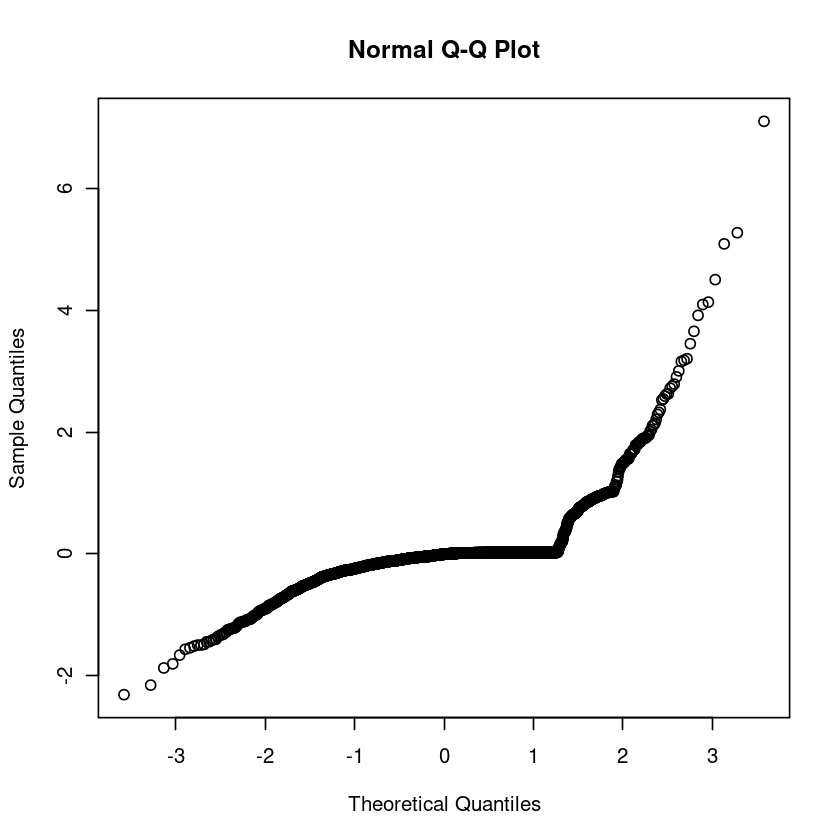

In [12]:
##정규성
qqnorm(lm_ols.step1$residuals)

In [13]:
shapiro.test(lm_ols.step1$residuals) ##정규성이라는 귀무가설을 기각하므로, 정규성가정을 위배합니다.


	Shapiro-Wilk normality test

data:  lm_ols.step1$residuals
W = 0.62132, p-value < 2.2e-16


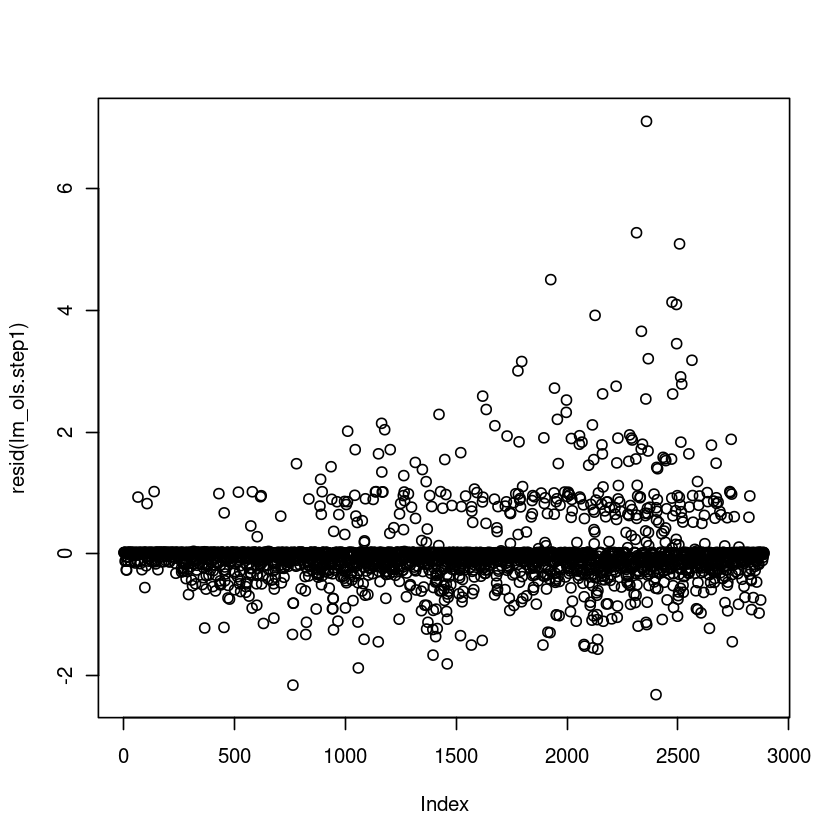

In [14]:
##독립성
plot(resid(lm_ols.step1)) ##메가폰 형태를 띈다. 독립성에 문제가 있습니다.

In [15]:
dwtest(lm_ols.step1)


	Durbin-Watson test

data:  lm_ols.step1
DW = 1.7871, p-value = 3.951e-09
alternative hypothesis: true autocorrelation is greater than 0


### 3) 반응변수 분포

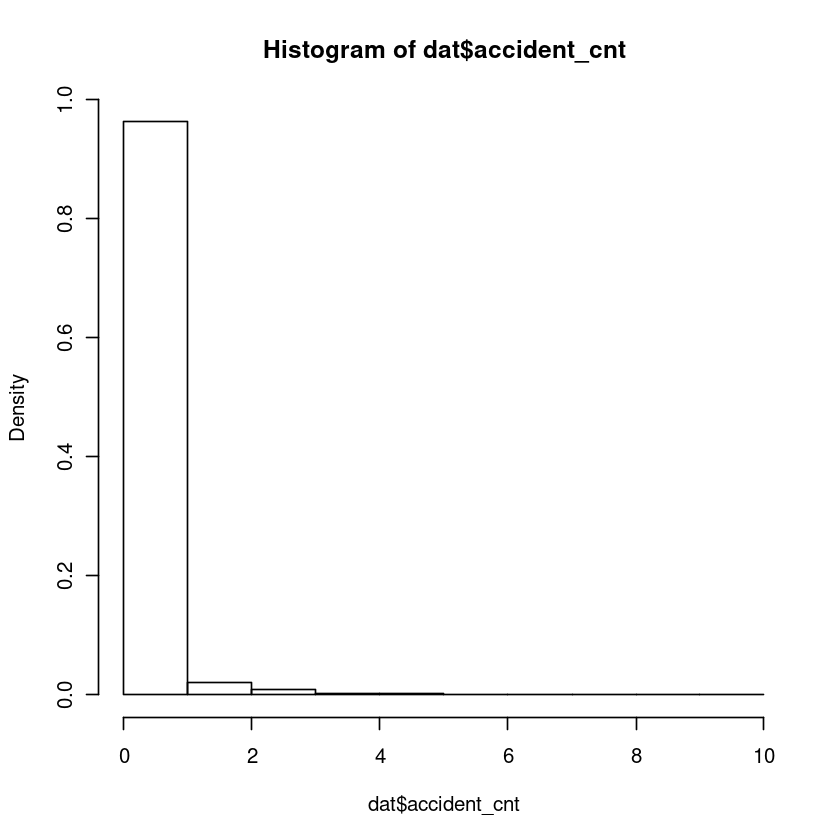

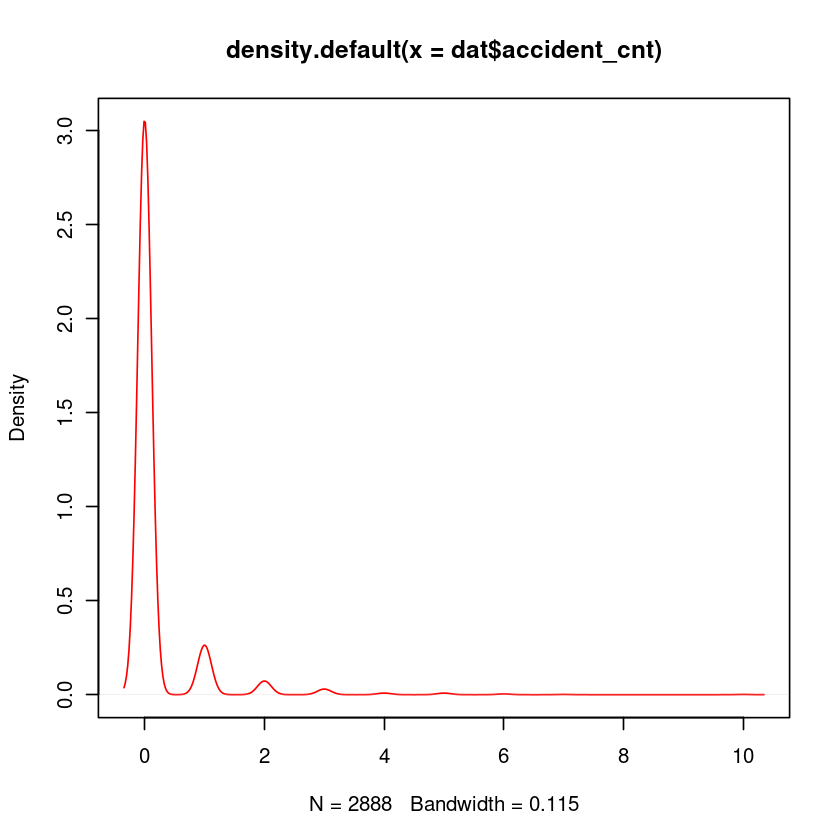

In [16]:
hist(dat$accident_cnt, freq=FALSE)
plot(density(dat$accident_cnt), col ='red')

반응변수가 0이 많은 도수데이터이기 때문에, 포아송이나 음이항회귀모형을 적합하였습니다.

## 2. 포아송회귀모형

In [17]:
lm_poisson <- glm(accident_cnt~., family=poisson, data=dat)
summary(lm_poisson)


Call:
glm(formula = accident_cnt ~ ., family = poisson, data = dat)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-2.3498  -0.4689  -0.2838  -0.2510   4.2746  

Coefficients: (1 not defined because of singularities)
              Estimate Std. Error z value Pr(>|z|)    
(Intercept) -3.461e+00  1.117e-01 -30.992  < 2e-16 ***
PSC_cnt      3.009e-04  1.312e-04   2.293 0.021870 *  
car_cnt     -2.549e-04  3.061e-04  -0.833 0.405044    
val_pop      2.852e-03  6.928e-04   4.116 3.85e-05 ***
val_youth   -1.192e-02  3.939e-03  -3.025 0.002484 ** 
pl_mean     -2.152e-02  2.726e-02  -0.789 0.429951    
pl_var       7.609e-02  4.877e-02   1.560 0.118730    
S_zone       3.608e-01  1.117e-01   3.230 0.001237 ** 
sign_cnt     1.948e-01  4.405e-02   4.422 9.76e-06 ***
CW_cnt       1.377e-01  3.323e-02   4.145 3.40e-05 ***
bump_cnt     2.035e-01  5.287e-02   3.849 0.000119 ***
TL_cnt      -2.529e-02  4.593e-02  -0.550 0.581980    
SW_cnt       7.126e-02  1.860e-02   3.831 0.00

In [18]:
##변수선택
lm_poisson.step <- step(lm_poisson, direction='both')
summary(lm_poisson.step)

Start:  AIC=2216.28
accident_cnt ~ PSC_cnt + car_cnt + val_pop + val_youth + pl_mean + 
    pl_var + S_zone + sign_cnt + CW_cnt + bump_cnt + TL_cnt + 
    SW_cnt + bus_cnt + jam_freq + node_cnt + road + CCTV + traf_pred + 
    school


Step:  AIC=2216.28
accident_cnt ~ PSC_cnt + car_cnt + val_pop + val_youth + pl_mean + 
    pl_var + S_zone + sign_cnt + CW_cnt + bump_cnt + TL_cnt + 
    SW_cnt + bus_cnt + jam_freq + node_cnt + CCTV + traf_pred + 
    school

            Df Deviance    AIC
- CCTV       1   1436.0 2214.3
- TL_cnt     1   1436.2 2214.6
- pl_mean    1   1436.5 2214.9
- car_cnt    1   1436.7 2215.1
<none>           1435.9 2216.3
- pl_var     1   1438.5 2216.9
- PSC_cnt    1   1440.5 2218.9
- node_cnt   1   1440.6 2219.0
- school     1   1443.3 2221.7
- bus_cnt    1   1444.5 2222.8
- val_youth  1   1445.3 2223.7
- S_zone     1   1445.8 2224.2
- traf_pred  1   1449.5 2227.9
- SW_cnt     1   1449.9 2228.3
- val_pop    1   1451.9 2230.3
- CW_cnt     1   1452.2 2230.5
- bump_cnt


Call:
glm(formula = accident_cnt ~ PSC_cnt + val_pop + val_youth + 
    pl_var + S_zone + sign_cnt + CW_cnt + bump_cnt + SW_cnt + 
    bus_cnt + jam_freq + node_cnt + traf_pred + school, family = poisson, 
    data = dat)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-2.5895  -0.4690  -0.2823  -0.2498   4.2822  

Coefficients:
              Estimate Std. Error z value Pr(>|z|)    
(Intercept) -3.470e+00  1.116e-01 -31.085  < 2e-16 ***
PSC_cnt      2.958e-04  1.223e-04   2.418 0.015615 *  
val_pop      2.650e-03  6.689e-04   3.961 7.47e-05 ***
val_youth   -1.125e-02  3.904e-03  -2.881 0.003959 ** 
pl_var       3.805e-02  1.163e-02   3.271 0.001071 ** 
S_zone       3.723e-01  1.058e-01   3.519 0.000433 ***
sign_cnt     1.906e-01  4.291e-02   4.443 8.89e-06 ***
CW_cnt       1.313e-01  3.136e-02   4.188 2.82e-05 ***
bump_cnt     1.805e-01  2.444e-02   7.386 1.51e-13 ***
SW_cnt       7.048e-02  1.846e-02   3.817 0.000135 ***
bus_cnt      1.933e-01  6.132e-02   3.152 0

In [19]:
## 과대산포 검정 
dispersiontest(lm_poisson.step) ##평균과 분산이 같다는 귀무가설을 기각합니다.


	Overdispersion test

data:  lm_poisson.step
z = 4.1636, p-value = 1.567e-05
alternative hypothesis: true dispersion is greater than 1
sample estimates:
dispersion 
  1.219077 


포아송회귀모형은 평균과 분산이 같다는 포아송 분포를 가정하는데, 이에 문제가 있기에 음이항회귀모형을 적합하였습니다.

## 3. 음이항회귀모형

In [20]:
lm_nb <- glm.nb(accident_cnt~., data=dat)
summary(lm_nb)


Call:
glm.nb(formula = accident_cnt ~ ., data = dat, init.theta = 1.164933515, 
    link = log)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-2.0348  -0.4421  -0.2733  -0.2390   3.6465  

Coefficients: (1 not defined because of singularities)
              Estimate Std. Error z value Pr(>|z|)    
(Intercept) -3.547e+00  1.226e-01 -28.937  < 2e-16 ***
PSC_cnt      2.310e-04  1.970e-04   1.173 0.240981    
car_cnt     -8.103e-05  3.236e-04  -0.250 0.802284    
val_pop      3.627e-03  8.206e-04   4.421 9.84e-06 ***
val_youth   -1.543e-02  4.696e-03  -3.285 0.001019 ** 
pl_mean     -2.029e-02  3.345e-02  -0.607 0.544061    
pl_var       7.823e-02  6.059e-02   1.291 0.196603    
S_zone       3.550e-01  1.396e-01   2.542 0.011019 *  
sign_cnt     2.277e-01  6.183e-02   3.683 0.000231 ***
CW_cnt       1.552e-01  4.227e-02   3.673 0.000240 ***
bump_cnt     2.443e-01  7.071e-02   3.454 0.000552 ***
TL_cnt      -5.258e-02  6.055e-02  -0.868 0.385221    
SW_cnt       7.786

In [21]:
lm_nb.step <- step(lm_nb, direction='both')
summary(lm_nb.step)

Start:  AIC=2166.45
accident_cnt ~ PSC_cnt + car_cnt + val_pop + val_youth + pl_mean + 
    pl_var + S_zone + sign_cnt + CW_cnt + bump_cnt + TL_cnt + 
    SW_cnt + bus_cnt + jam_freq + node_cnt + road + CCTV + traf_pred + 
    school


Step:  AIC=2166.45
accident_cnt ~ PSC_cnt + car_cnt + val_pop + val_youth + pl_mean + 
    pl_var + S_zone + sign_cnt + CW_cnt + bump_cnt + TL_cnt + 
    SW_cnt + bus_cnt + jam_freq + node_cnt + CCTV + traf_pred + 
    school




Call:
glm.nb(formula = accident_cnt ~ PSC_cnt + car_cnt + val_pop + 
    val_youth + pl_mean + pl_var + S_zone + sign_cnt + CW_cnt + 
    bump_cnt + TL_cnt + SW_cnt + bus_cnt + jam_freq + node_cnt + 
    CCTV + traf_pred + school, data = dat, init.theta = 1.164985128, 
    link = log)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-2.0347  -0.4421  -0.2733  -0.2390   3.6465  

Coefficients:
              Estimate Std. Error z value Pr(>|z|)    
(Intercept) -3.547e+00  1.226e-01 -28.937  < 2e-16 ***
PSC_cnt      2.310e-04  1.970e-04   1.173 0.240918    
car_cnt     -8.107e-05  3.236e-04  -0.250 0.802208    
val_pop      3.627e-03  8.206e-04   4.420 9.85e-06 ***
val_youth   -1.543e-02  4.696e-03  -3.285 0.001019 ** 
pl_mean     -2.029e-02  3.345e-02  -0.607 0.544066    
pl_var       7.823e-02  6.059e-02   1.291 0.196603    
S_zone       3.550e-01  1.396e-01   2.542 0.011018 *  
sign_cnt     2.277e-01  6.183e-02   3.682 0.000231 ***
CW_cnt       1.552e-01  4.227e-02 

## 4. 모형 적합도 비교

In [22]:
## AIC비교
AIC(lm_ols.step1, lm_poisson.step, lm_nb.step)

,df,AIC
,<dbl>,<dbl>
lm_ols.step1,14,4490.701
lm_poisson.step,15,2210.161
lm_nb.step,20,2168.445


음이항회귀모형이 가장 적합하지만 격자 데이터는 공간적 의존성이 존재할 수 있기에 공간회귀모델이 필요하고 판단하였습니다. 공간회귀모델을 적합하기에 앞서 종속변수의 공간자기상관성을 진단하였습니다.

## 5. 공간자기상관성 검정

In [23]:
options(repr.plot.width = 10, repr.plot.height = 10)

tmap mode set to plotting



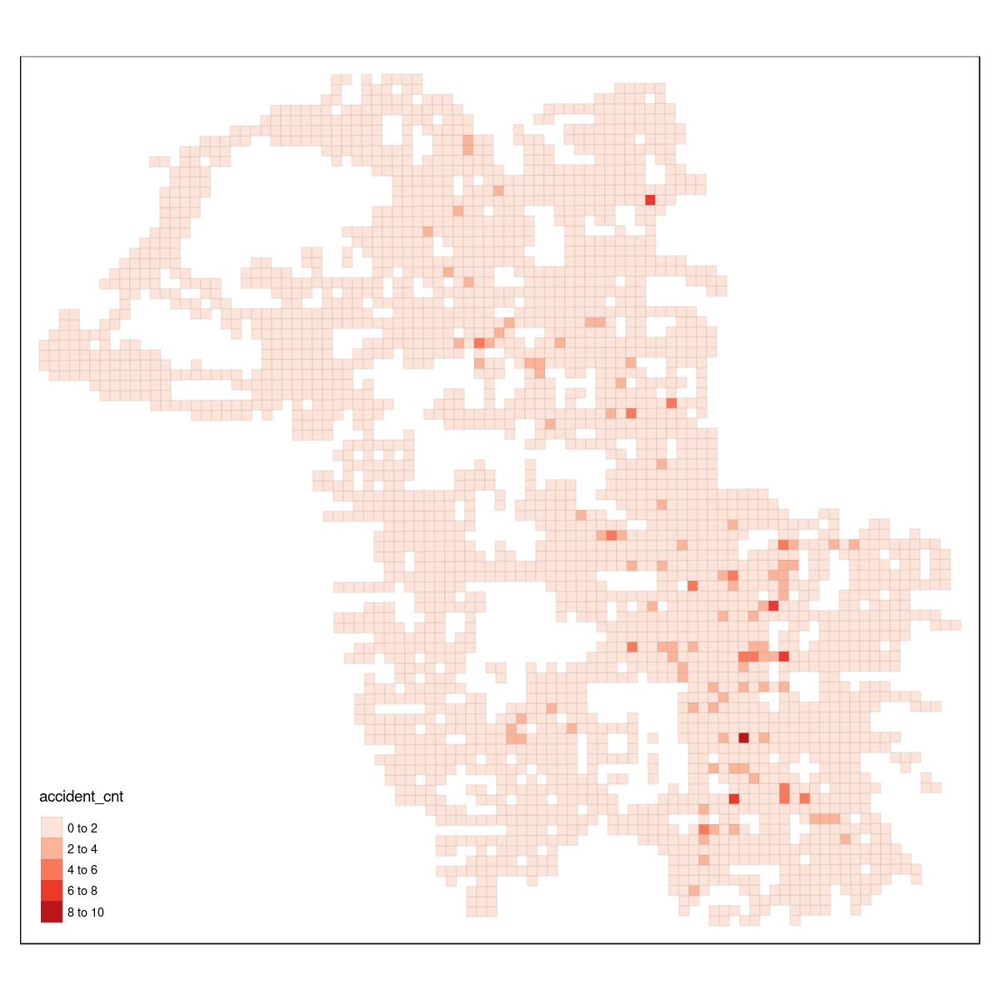

In [24]:
tmap_mode("plot")
tm_shape(final_data) +
 tm_fill('accident_cnt', style='pretty', palette='Reds') +
 tm_borders(alpha=.1)

어린이 교통사고수를 격자별로 시각화한 지도입니다. 어린이교통사고수에 공간적 패턴이 보입니다. 

### 1) Global Moran's I 검정

종속변수인 어린이 교통사고 수의 공간적자기상관성이 있는지 판단하기 위해 Moran's I 검정을 했습니다.

In [25]:
##공간데이터로 바꾸기
sp_data  <- as(final_data, 'Spatial')
sp_data

class       : SpatialPolygonsDataFrame 
features    : 2888 
extent      : 126.9953, 127.098, 37.1249, 37.2005  (xmin, xmax, ymin, ymax)
crs         : +proj=longlat +datum=WGS84 +no_defs 
variables   : 21
names       :        gid, PSC_cnt, accident_cnt, car_cnt, val_pop, val_youth,          pl_mean,           pl_var, S_zone, sign_cnt, CW_cnt, bump_cnt, TL_cnt, SW_cnt, bus_cnt, ... 
min values  : 다사552085,       0,            0,       0,       0,         0,                0,                0,      0,        0,      0,        0,      0,      0,       0, ... 
max values  : 다사642059,    4286,           10,    3002,    2069,       422, 40.0307378472222, 25.8005025872455,      1,        5,     10,       12,     15,     15,       4, ... 

In [26]:
##이웃(neighbours)정의
w <- poly2nb(sp_data, row.names=sp_data$gid)
w

Neighbour list object:
Number of regions: 2888 
Number of nonzero links: 18274 
Percentage nonzero weights: 0.2190984 
Average number of links: 6.327562 
1 region with no links:
다사612048

In [27]:
##이웃이 없는 격자 제외
final_data <- final_data %>% filter(gid != "다사612048")
sp_data  <- as(final_data, 'Spatial')
w <- poly2nb(sp_data, row.names=sp_data$gid)
w

Neighbour list object:
Number of regions: 2887 
Number of nonzero links: 18274 
Percentage nonzero weights: 0.2192502 
Average number of links: 6.329754 

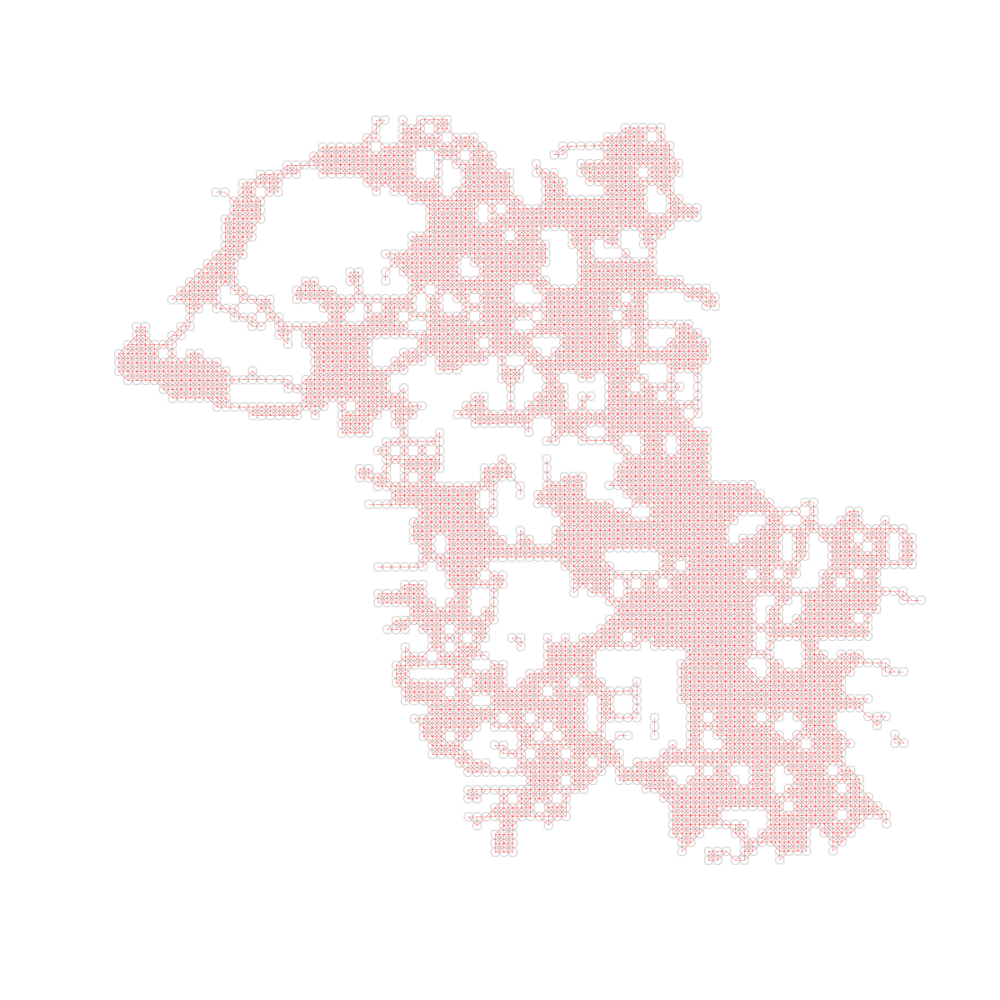

In [28]:
# 격자별 이웃관계 시각화
plot(sp_data, col='white', border='grey', lwd=0.1)
xy <- coordinates(sp_data)

plot(w, xy, col='red', lwd=0.1, add=TRUE)

In [29]:
##가중치행렬 생성 
ww <- nb2listw(w, style='W') ## row-standardised matrix
ww

Characteristics of weights list object:
Neighbour list object:
Number of regions: 2887 
Number of nonzero links: 18274 
Percentage nonzero weights: 0.2192502 
Average number of links: 6.329754 

Weights style: W 
Weights constants summary:
     n      nn   S0       S1       S2
W 2887 8334769 2887 995.2858 11644.17

In [30]:
##Moran's I
moran(final_data$accident_cnt, ww, n=length(ww$neighbours), S0=Szero(ww))

$I
[1] 0.1493231

$K
[1] 49.93144

In [31]:
##Moran's I가 유의한지 확인
set.seed(1234)
results <- moran.mc(final_data$accident_cnt, ww, nsim=99) # nsim : # of permutations want to run
results


	Monte-Carlo simulation of Moran I

data:  final_data$accident_cnt 
weights: ww  
number of simulations + 1: 100 

statistic = 0.14932, observed rank = 100, p-value = 0.01
alternative hypothesis: greater


Moran's I지수가 0.15이며,p-value가 0.01이므로 통계적으로 유의미한 공간자기상관성이 존재한다고 볼 수 있습니다.  

### 2) LISA분석
Moran's i 지수는 전역적 통계량이므로 큰 값이 군집되어 있는 경우와 작은 값이 군집되어 있는 경우를 구분할 수 있는 한계를 가지기에, 공간적 군집을 알 수 있는 국지적 Moran's i (LISA)를 시각화했습니다.   

tmap mode set to plotting



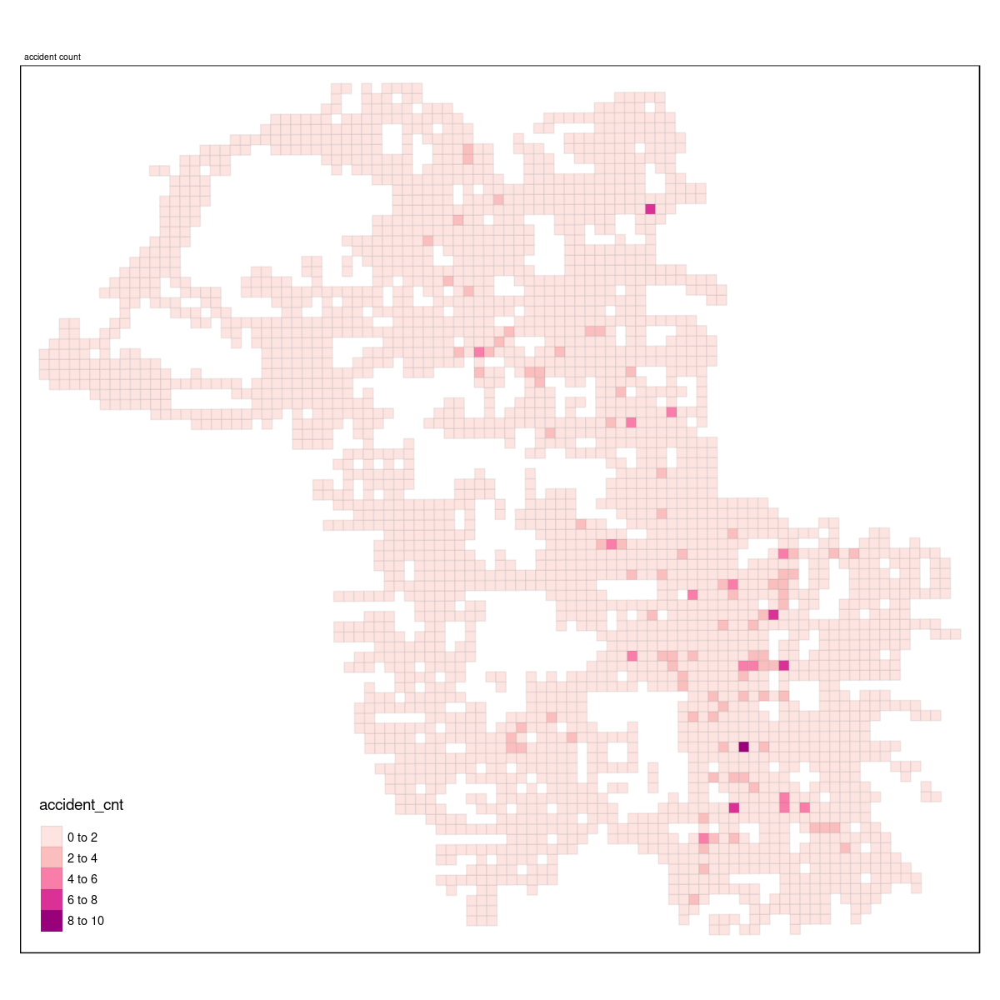

In [32]:
tmap_mode('plot')
tm_shape(final_data) +
 tm_fill('accident_cnt', style='pretty', palette='RdPu') +
 tm_borders(alpha=.1) + 
 tm_layout(main.title='accident count', main.title.size=0.5)

In [33]:
local_m <- localmoran(final_data$accident_cnt, ww)
summary(local_m)

       Ii                 E.Ii                Var.Ii            Z.Ii         
 Min.   :-2.630795   Min.   :-0.0003465   Min.   :0.1226   Min.   :-7.51288  
 1st Qu.:-0.009611   1st Qu.:-0.0003465   1st Qu.:0.1226   1st Qu.:-0.02091  
 Median : 0.080774   Median :-0.0003465   Median :0.1401   Median : 0.16372  
 Mean   : 0.149323   Mean   :-0.0003465   Mean   :0.1734   Mean   : 0.39654  
 3rd Qu.: 0.080774   3rd Qu.:-0.0003465   3rd Qu.:0.1963   3rd Qu.: 0.21669  
 Max.   :18.805143   Max.   :-0.0003465   Max.   :0.9830   Max.   :53.71076  
   Pr(z > 0)     
 Min.   :0.0000  
 1st Qu.:0.4142  
 Median :0.4350  
 Mean   :0.4705  
 3rd Qu.:0.5083  
 Max.   :1.0000  

In [34]:
# scaling 해서 새로운 column 으로 저장
final_data$s_acc_cnt <- scale(final_data$accident_cnt) %>% as.vector()

In [35]:
# spatial lag 변수 생성 
final_data$lag_s_acc_cnt <- lag.listw(ww, final_data$accident_cnt)

In [36]:
summary(final_data$s_acc_cnt)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-0.2842 -0.2842 -0.2842  0.0000 -0.2842 15.6144 

In [37]:
summary(final_data$lag_s_acc_cnt)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.000   0.000   0.000   0.183   0.250   2.167 

In [38]:
final_data <- st_as_sf(final_data) %>% 
    mutate(quad_sig = ifelse(final_data$s_acc_cnt > 0 &
                            final_data$lag_s_acc_cnt > 0 &
                            local_m[,5] <= 0.05,
                            "high-high",
                      ifelse(final_data$s_acc_cnt <= 0 &
                            final_data$lag_s_acc_cnt <= 0 &
                            local_m[,5] <= 0.05,
                            "low-low",
                      ifelse(final_data$s_acc_cnt > 0 &
                            final_data$lag_s_acc_cnt <= 0 &
                            local_m[,5] <= 0.05, 
                            "high-low",
                      ifelse(final_data$s_acc_cnt <= 0 &
                            final_data$lag_s_acc_cnt > 0 &
                            local_m[,5] <= 0.05,
                            "low-high", 
                            "non-significant")))))

In [39]:
table(final_data$quad_sig)


      high-high non-significant 
            139            2748 

In [40]:
nrow(local_m[local_m[,5] <= 0.05,])

[1] 139

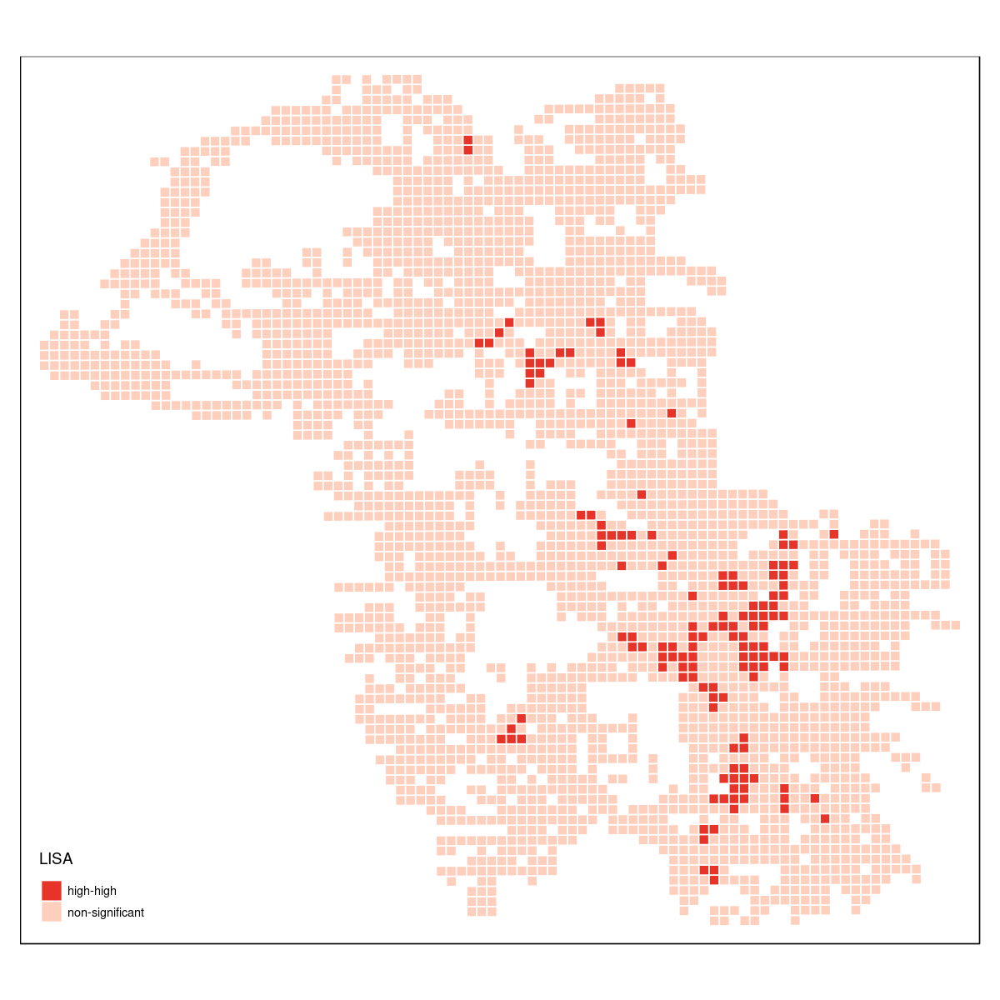

In [41]:
qtm(final_data, fill='quad_sig', fill.title='LISA',
   fill.palette = "-Reds", border='white')

#### 지역적 Moran's I 해석  

- 각 지역의 LISA 값은 각각 global Moran's I 계산에 기여하는 바에 따라 결정됩니다
- 통계적으로 유의한지 여부는 모든 영역 단위들 사이의 데이터를 무작위 재할당하여 계산한 값과 실제 값을 비교하여 평가합니다
- 위 그래프를 통해 어떠한 공간적 군집이 나타나는지 알 수 있습니다


#### 공간적자기상관성을 고려하는 공간회귀모형이 필요하다고 판단됩니다

## 6. 전역적 공간회귀모형

전역적 공간회귀모형인 공간시차모형(SLM)과 공간오차모형(SEM)을 적합하고 이를 일반회귀(OLS회귀)모형과 비교했습니다.

### 1) 공간가중치행렬

공간회귀모델을 적합하기 위해서는 지역의 인접성을 정의하는 공간가중행렬이 필요합니다. 가중치행렬은 i지역과 j지역이 공간적으로 인접한지의 여부를 행렬로 나타낸 것으로 공간상에서의 이웃관계를 파악할 때 사용합니다. 

In [42]:
final_data <- st_read('analysis1_dataset.geojson')

Reading layer `analysis1_dataset' from data source `/opt/app-root/src/analysis1_dataset.geojson' using driver `GeoJSON'
Simple feature collection with 2888 features and 21 fields
geometry type:  MULTIPOLYGON
dimension:      XY
bbox:           xmin: 126.9953 ymin: 37.1249 xmax: 127.098 ymax: 37.2005
geographic CRS: WGS 84


In [43]:
##이웃이 없는 데이터 제외
final_data <- final_data %>% filter(gid != "다사612048")

In [44]:
## 회귀분석에 쓸 컬럼만 데이터프레임으로 변환
dat <- data.frame(final_data) %>% filter(gid != "다사612048") %>% dplyr::select(-gid, -geometry)

In [45]:
## OLS식 구하기
lm_ols1 <- lm(accident_cnt ~ PSC_cnt + val_pop + pl_mean + S_zone + sign_cnt + CW_cnt + bump_cnt + TL_cnt + 
    bus_cnt + jam_freq + node_cnt + school, data=dat)

In [46]:
##공간데이터로 변환
final_sp <- as(final_data, "Spatial")

In [47]:
##이웃 정의
w <- poly2nb(final_sp, row.names=final_sp$gid)
w

Neighbour list object:
Number of regions: 2887 
Number of nonzero links: 18274 
Percentage nonzero weights: 0.2192502 
Average number of links: 6.329754 

In [48]:
##공간가중치행렬 만들기
wm <- nb2mat(w, style='W')
rwm <- mat2listw(wm, style='W')

In [49]:
lm.morantest(lm_ols1, rwm, alternative="two.sided")


	Global Moran I for regression residuals

data:  
model: lm(formula = accident_cnt ~ PSC_cnt + val_pop + pl_mean + S_zone
+ sign_cnt + CW_cnt + bump_cnt + TL_cnt + bus_cnt + jam_freq + node_cnt
+ school, data = dat)
weights: rwm

Moran I statistic standard deviate = 7.283, p-value = 3.264e-13
alternative hypothesis: two.sided
sample estimates:
Observed Moran I      Expectation         Variance 
    0.0781994373    -0.0011641354     0.0001187461 


일반회귀모형 잔차의 분포가 공간적 자기상관성을 띄는지 검정했습니다. Moran's i 지수가 0.08로 줄어들었지만 여전히 통계적으로 유의합니다. 

### 2) 라그랑주 승수 검정

일반회귀모형 분석을 통해 어린이교통사고에 영향을 미칠 변수들을 조합하고 최적화한 후 다양한 통계적 검정을 통해 가장 적합한 공간분석 모형을 선택합니다.

In [50]:
# OLS모형의 LM검정 결과
lm.LMtests(lm_ols1, rwm, test = c("LMerr","LMlag","RLMerr","RLMlag","SARMA"))


	Lagrange multiplier diagnostics for spatial dependence

data:  
model: lm(formula = accident_cnt ~ PSC_cnt + val_pop + pl_mean + S_zone
+ sign_cnt + CW_cnt + bump_cnt + TL_cnt + bus_cnt + jam_freq + node_cnt
+ school, data = dat)
weights: rwm

LMerr = 51.21, df = 1, p-value = 8.3e-13


	Lagrange multiplier diagnostics for spatial dependence

data:  
model: lm(formula = accident_cnt ~ PSC_cnt + val_pop + pl_mean + S_zone
+ sign_cnt + CW_cnt + bump_cnt + TL_cnt + bus_cnt + jam_freq + node_cnt
+ school, data = dat)
weights: rwm

LMlag = 48.683, df = 1, p-value = 3.008e-12


	Lagrange multiplier diagnostics for spatial dependence

data:  
model: lm(formula = accident_cnt ~ PSC_cnt + val_pop + pl_mean + S_zone
+ sign_cnt + CW_cnt + bump_cnt + TL_cnt + bus_cnt + jam_freq + node_cnt
+ school, data = dat)
weights: rwm

RLMerr = 4.3606, df = 1, p-value = 0.03678


	Lagrange multiplier diagnostics for spatial dependence

data:  
model: lm(formula = accident_cnt ~ PSC_cnt + val_pop + pl_mean + 

라그랑지 승수검정을 통해 일반회귀모형이 비해 공간회귀모형이 더 적절한지, 적절하다면 어떤 모형을 사용하는 것이 더 바람직한지를 판단할 수 있습니다.  

다음은 LM test의 결과를 정리한 것입니다.

#### * Lagrange multiplier(lag) 검정 : 유의 - 공간시차모형이 회귀모형에 비해 더 적합
#### * Lagrange multiplier(error) 검정 : 유의 - 공간오차모형이 회귀모형에 비해 더 적합
#### * Robust LM(lag) 검정 : 유의하지 않음 - 공간시차모형이 회귀모형에 비해 더 적합하지 않음
#### * Robust LM(error) 검정 : 유의 - 공간오차모형이 회귀모형에 비해 더 적합
#### * Lagrange Multiplier(SARMA) 검정 : SAM과 SEM 모형을 동시에 사용했을 때 유의

### 3) 공간시차모델(SLM)

In [51]:
lm_lag <- lagsarlm(accident_cnt ~ PSC_cnt + val_pop+ pl_mean + S_zone + sign_cnt + CW_cnt + bump_cnt + TL_cnt + 
    bus_cnt + jam_freq + node_cnt + school , data=final_sp, rwm)
summary(lm_lag)


Call:lagsarlm(formula = accident_cnt ~ PSC_cnt + val_pop + pl_mean + 
    S_zone + sign_cnt + CW_cnt + bump_cnt + TL_cnt + bus_cnt + 
    jam_freq + node_cnt + school, data = final_sp, listw = rwm)

Residuals:
       Min         1Q     Median         3Q        Max 
-2.2739551 -0.1438457 -0.0011945  0.0324418  7.1470312 

Type: lag 
Coefficients: (asymptotic standard errors) 
               Estimate  Std. Error z value  Pr(>|z|)
(Intercept) -3.3028e-02  1.3365e-02 -2.4711  0.013469
PSC_cnt      3.5320e-04  6.7144e-05  5.2603 1.438e-07
val_pop      2.7157e-05  7.4968e-05  0.3622  0.717170
pl_mean      3.8179e-03  2.3503e-03  1.6245  0.104279
S_zone       5.4220e-02  2.8767e-02  1.8848  0.059460
sign_cnt     1.3833e-01  1.6280e-02  8.4968 < 2.2e-16
CW_cnt       4.9461e-02  1.2115e-02  4.0825 4.455e-05
bump_cnt     2.0381e-01  1.9569e-02 10.4145 < 2.2e-16
TL_cnt      -3.9425e-02  1.6240e-02 -2.4277  0.015196
bus_cnt      7.1133e-02  2.2769e-02  3.1242  0.001783
jam_freq     3.8661e-04  3.

In [52]:
lm_lag$rho

rho 
0.1835881

공간시차항을 통해 어린이교통사고에 대한 인접지역의 영향력을 알 수 있습니다.
rho는 0.18이며 이는 통계적으로 유의합니다.

In [53]:
impacts(lm_lag, listw = rwm) # 변수별로 자기자신과 이웃의 영향력 알 수 있음 

Impact measures (lag, exact):
                Direct      Indirect         Total
PSC_cnt   0.0003553707  7.725462e-05  4.326253e-04
val_pop   0.0000273234  5.939879e-06  3.326328e-05
pl_mean   0.0038413926  8.350866e-04  4.676479e-03
S_zone    0.0545529679  1.185936e-02  6.641233e-02
sign_cnt  0.1391801032  3.025659e-02  1.694367e-01
CW_cnt    0.0497650455  1.081850e-02  6.058355e-02
bump_cnt  0.2050579625  4.457789e-02  2.496358e-01
TL_cnt   -0.0396675017 -8.623383e-03 -4.829088e-02
bus_cnt   0.0715705749  1.555884e-02  8.712942e-02
jam_freq  0.0003889885  8.456284e-05  4.735513e-04
node_cnt  0.0491952777  1.069464e-02  5.988992e-02
school    0.0136589767  2.969347e-03  1.662832e-02

### 4) 공간오차모델(SEM)

In [54]:
lm_err <- errorsarlm(accident_cnt ~ PSC_cnt + val_pop + pl_mean + S_zone + sign_cnt + CW_cnt + bump_cnt + TL_cnt + 
    bus_cnt + jam_freq + node_cnt + school, data=final_sp, rwm)
summary(lm_err)


Call:errorsarlm(formula = accident_cnt ~ PSC_cnt + val_pop + pl_mean + 
    S_zone + sign_cnt + CW_cnt + bump_cnt + TL_cnt + bus_cnt + 
    jam_freq + node_cnt + school, data = final_sp, listw = rwm)

Residuals:
       Min         1Q     Median         3Q        Max 
-2.1558834 -0.1369117 -0.0050729  0.0186753  7.1492366 

Type: error 
Coefficients: (asymptotic standard errors) 
               Estimate  Std. Error z value  Pr(>|z|)
(Intercept) -1.6028e-02  1.5997e-02 -1.0020  0.316367
PSC_cnt      3.5289e-04  6.7239e-05  5.2483 1.535e-07
val_pop      3.6137e-05  7.8414e-05  0.4608  0.644906
pl_mean      5.4788e-03  2.5219e-03  2.1725  0.029820
S_zone       6.1011e-02  3.2055e-02  1.9033  0.056999
sign_cnt     1.3453e-01  1.6415e-02  8.1954 2.220e-16
CW_cnt       5.6016e-02  1.2359e-02  4.5324 5.833e-06
bump_cnt     2.0190e-01  1.9715e-02 10.2410 < 2.2e-16
TL_cnt      -3.6146e-02  1.6273e-02 -2.2211  0.026341
bus_cnt      7.0802e-02  2.2479e-02  3.1496  0.001635
jam_freq     6.3531e-04

In [55]:
lm_err$lambda

lambda 
0.2150501

In [56]:
Hausman.test(lm_err) # spatial error 과 OLS 추정치가 동일하다는 귀무가설을 기각합니다. 


	Spatial Hausman test (asymptotic)

data:  NULL
Hausman test = 97.748, df = 13, p-value = 4.552e-15


공간오차항을 통해 어린이교통사고에 대한 인접지역의 영향력을 알 수 있습니다. lambda는 0.22이며 이는 통계적으로 유의하다고 할 수 있습니다.

### 5) 모델 분석 및 비교

OLS 회귀모형과 공간시차모형(SLM), 공간오차모형(SEM)을 비교했습니다. 
#### 회귀계수 비교

In [57]:
ols_co <- data.frame(lm_ols1$coefficients)
lag_co <- data.frame(lm_lag$coefficients)
err_co <- data.frame(lm_err$coefficients)

In [58]:
##회귀계수 비교
compare_co <- cbind(ols_co, lag_co, err_co)
coeff_name <- compare_co %>% rownames()
compare_co

,lm_ols1.coefficients,lm_lag.coefficients,lm_err.coefficients
,<dbl>,<dbl>,<dbl>
(Intercept),-2.442243e-02,-3.302762e-02,-1.602846e-02
PSC_cnt,3.557832e-04,3.532005e-04,3.528936e-04
val_pop,9.318698e-05,2.715654e-05,3.613687e-05
pl_mean,6.768785e-03,3.817933e-03,5.478845e-03
S_zone,6.454306e-02,5.421982e-02,6.101115e-02
sign_cnt,1.411325e-01,1.383301e-01,1.345260e-01
CW_cnt,4.867892e-02,4.946113e-02,5.601607e-02
bump_cnt,2.089133e-01,2.038057e-01,2.019023e-01
TL_cnt,-4.252578e-02,-3.942526e-02,-3.614560e-02


In [59]:
##회귀계수 변화 비교
compare_co <- compare_co %>% mutate(lm_lag = lm_lag.coefficients-lm_ols1.coefficients, lm_err =lm_err.coefficients- lm_ols1.coefficients)
comapre_co1 <- compare_co  %>% dplyr::select(lm_ols1.coefficients,lm_lag, lm_err)
compare_co1 <- cbind(coeff_name, comapre_co1)
compare_co1

coeff_name,lm_ols1.coefficients,lm_lag,lm_err
<fct>,<dbl>,<dbl>,<dbl>
(Intercept),-2.442243e-02,-8.605189e-03,8.393978e-03
PSC_cnt,3.557832e-04,-2.582720e-06,-2.889568e-06
val_pop,9.318698e-05,-6.603044e-05,-5.705011e-05
pl_mean,6.768785e-03,-2.950852e-03,-1.289940e-03
S_zone,6.454306e-02,-1.032324e-02,-3.531907e-03
sign_cnt,1.411325e-01,-2.802350e-03,-6.606465e-03
CW_cnt,4.867892e-02,7.822187e-04,7.337158e-03
bump_cnt,2.089133e-01,-5.107661e-03,-7.011034e-03
TL_cnt,-4.252578e-02,3.100529e-03,6.380181e-03


OLS의 회귀 계수가 어느만큼 과소 혹은 과대추정되었는지 알 수 있습니다.
  
  #### 모델 적합성 비교

In [60]:
result1 <- AIC(lm_ols1, lm_lag, lm_err)
result1

,df,AIC
,<dbl>,<dbl>
lm_ols1,14,4490.154
lm_lag,15,4445.819
lm_err,15,4442.181


공간오차모델이 적합성이 가장 높습니다.

#### 모델 설명력 비교

In [61]:
R.squared <-c( glance(lm_ols1)$r.squared,glance(lm_lag)$r.squared,glance(lm_err)$r.squared)
result1$R.squared <- R.squared
result1 %>% dplyr::select(R.squared)

,R.squared
,<dbl>
lm_ols1,0.3055534
lm_lag,0.3207302
lm_err,0.3232458


공간오차모델이 설명력이 가장 높습니다.

#### 모델 등분산성 비교

In [62]:
##회귀모형 등분산성 검정
bptest(lm_ols1) 


	studentized Breusch-Pagan test

data:  lm_ols1
BP = 550.59, df = 12, p-value < 2.2e-16


In [63]:
##공간지연모델 등분산성 검정
bptest.sarlm(lm_lag)


	studentized Breusch-Pagan test

data:  
BP = 549.12, df = 12, p-value < 2.2e-16


In [64]:
##공간오차모델 등분산성 검정
bptest.sarlm(lm_err)


	studentized Breusch-Pagan test

data:  
BP = 545.24, df = 12, p-value < 2.2e-16


세 모형 모두 등분산성 가정을 만족하지 못합니다. 

## 7. 국지적 공간회귀모형

전역적 공간회귀모형인 공간시차모형과 공간오차모형과 달리 국지적 공간회귀모형인 지리적 가중회귀모형은 공간적 의존성 뿐만 아니라 분석대상에 따라 변수의 영향이 달라지는 공간적 이질성을 고려할 수 있는 모형입니다. 따라서 지리적 가중회귀모형을 적합했습니다.

In [65]:
names(sp_data) 

[1] "gid"          "PSC_cnt"      "accident_cnt" "car_cnt"      "val_pop"     
 [6] "val_youth"    "pl_mean"      "pl_var"       "S_zone"       "sign_cnt"    
[11] "CW_cnt"       "bump_cnt"     "TL_cnt"       "SW_cnt"       "bus_cnt"     
[16] "jam_freq"     "node_cnt"     "road"         "CCTV"         "traf_pred"   
[21] "school"

### 1) 지리가중회귀 모델(GWR)

지리적 가중회귀모형은 대역폭의 영향을 많이 받았습니다. CV를 통해 최적의 대역폭을 계산했습니다. 

In [66]:
# 최적의 대역폭(bandwidth) 찾기
bw = gwr.sel(accident_cnt ~ PSC_cnt + val_pop + pl_mean + S_zone + sign_cnt +
             CW_cnt + bump_cnt + TL_cnt + bus_cnt + jam_freq + node_cnt + school,
             data=sp_data, adapt=T)

Adaptive q: 0.381966 CV score: 793.095 
Adaptive q: 0.618034 CV score: 805.6025 
Adaptive q: 0.236068 CV score: 784.4991 
Adaptive q: 0.145898 CV score: 780.0282 
Adaptive q: 0.09016994 CV score: 778.8881 
Adaptive q: 0.06679423 CV score: 778.9524 
Adaptive q: 0.08316964 CV score: 778.4239 
Adaptive q: 0.0788082 CV score: 778.2993 
Adaptive q: 0.07668687 CV score: 778.5101 
Adaptive q: 0.08026506 CV score: 778.6551 
Adaptive q: 0.07799792 CV score: 778.3605 
Adaptive q: 0.07936467 CV score: 778.6795 
Adaptive q: 0.0784987 CV score: 778.3332 
Adaptive q: 0.07902075 CV score: 778.3595 
Adaptive q: 0.07872627 CV score: 778.2914 
Adaptive q: 0.07868558 CV score: 778.2875 
Adaptive q: 0.0786142 CV score: 778.2874 
Adaptive q: 0.07857351 CV score: 778.3034 
Adaptive q: 0.0786142 CV score: 778.2874 


In [67]:
# estimated optimal bandwidth
bw

[1] 0.0786142

In [68]:
# GWR model 
gwr.model = gwr(accident_cnt~ PSC_cnt + val_pop + pl_mean + S_zone + sign_cnt +
             CW_cnt + bump_cnt + TL_cnt + bus_cnt + jam_freq + node_cnt + school,
               data=sp_data, adapt=bw, hatmatrix=TRUE, se.fit=TRUE)
gwr.model

Warning message in proj4string(data):
“CRS object has comment, which is lost in output”


Call:
gwr(formula = accident_cnt ~ PSC_cnt + val_pop + pl_mean + S_zone + 
    sign_cnt + CW_cnt + bump_cnt + TL_cnt + bus_cnt + jam_freq + 
    node_cnt + school, data = sp_data, adapt = bw, hatmatrix = TRUE, 
    se.fit = TRUE)
Kernel function: gwr.Gauss 
Adaptive quantile: 0.0786142 (about 226 of 2887 data points)
Summary of GWR coefficient estimates at data points:
                    Min.     1st Qu.      Median     3rd Qu.        Max.
X.Intercept. -5.3643e-02 -1.3202e-02 -3.9360e-03  2.3477e-03  3.9572e-02
PSC_cnt      -2.0754e-04  1.3007e-04  1.7992e-04  4.7253e-04  1.6742e-03
val_pop      -1.4701e-04  7.7004e-06  7.0950e-05  1.6496e-04  3.9051e-04
pl_mean      -4.4138e-03  1.5939e-04  2.7224e-03  8.1446e-03  1.8146e-02
S_zone       -6.2108e-02  1.6687e-02  3.6248e-02  6.3525e-02  1.3722e-01
sign_cnt      1.0327e-02  5.5423e-02  1.0991e-01  2.1247e-01  3.1945e-01
CW_cnt       -2.3168e-02  3.2350e-02  4.7658e-02  6.6421e-02  1.1650e-01
bump_cnt     -9.6262e-02  1.1515e-01  1.6654

In [69]:
# AIC
gwr.model$results$AICh

[1] 3987.164

In [70]:
# OLS 와 GWR models 비교
BFC02.gwr.test(gwr.model)
BFC99.gwr.test(gwr.model)
LMZ.F1GWR.test(gwr.model)
LMZ.F2GWR.test(gwr.model)


	Brunsdon, Fotheringham & Charlton (2002, pp. 91-2) ANOVA

data:  gwr.model
F = 1.2094, df1 = 2874, df2 = 2784, p-value = 2.218e-07
alternative hypothesis: greater
sample estimates:
SS OLS residuals SS GWR residuals 
        792.9012         655.6004 



	Brunsdon, Fotheringham & Charlton (1999) ANOVA

data:  gwr.model
F = 6.4797, df1 = 966.64, df2 = 2820.64, p-value < 2.2e-16
alternative hypothesis: greater
sample estimates:
SS GWR improvement   SS GWR residuals 
          137.3008           655.6004 



	Leung et al. (2000) F(1) test

data:  gwr.model
F = 0.85356, df1 = 2820.6, df2 = 2874.0, p-value = 1.218e-05
alternative hypothesis: less
sample estimates:
SS OLS residuals SS GWR residuals 
        792.9012         655.6004 



	Leung et al. (2000) F(2) test

data:  gwr.model
F = 5.5308, df1 = 150.39, df2 = 2874.00, p-value < 2.2e-16
alternative hypothesis: greater
sample estimates:
  SS OLS residuals SS GWR improvement 
          792.9012           137.3008 


위의 검정 결과로 OLS 회귀모형보다 지리적 가중회귀모형의 설명력이 향상되었음을 알 수 있습니다.

In [71]:
LMZ.F3GWR.test(gwr.model) 


Leung et al. (2000) F(3) test

            F statistic Numerator d.f. Denominator d.f.     Pr(>)    
(Intercept)     0.47048     1591.61591           2820.6    1.0000    
PSC_cnt        18.49709       28.04699           2820.6 < 2.2e-16 ***
val_pop         0.96558       91.31225           2820.6    0.5732    
pl_mean         1.97209      113.29650           2820.6 9.432e-09 ***
S_zone          0.73295      218.20754           2820.6    0.9985    
sign_cnt       11.63087      226.22342           2820.6 < 2.2e-16 ***
CW_cnt          2.21304      151.22457           2820.6 1.093e-14 ***
bump_cnt        4.27782      126.10582           2820.6 < 2.2e-16 ***
TL_cnt          5.52495       84.39051           2820.6 < 2.2e-16 ***
bus_cnt         4.31787      151.30779           2820.6 < 2.2e-16 ***
jam_freq        0.99917      563.39604           2820.6    0.4993    
node_cnt        3.48189      146.65610           2820.6 < 2.2e-16 ***
school         20.39919       20.17197           2820.6 < 

위의 결과로 어떤 변수가 통계적으로 유의한  공간적 이질성(spatial heterogeneity)을 갖는지 확인할 수 있습니다. 

In [72]:
# local R square 분포
gwr.model$SDF$localR2 %>% summary()

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.2776  0.3664  0.4047  0.4052  0.4508  0.5308 

###  2) 계수 GWR 시각화

In [73]:
results  <- data.frame(gwr.model$SDF)
results %>% head()

,sum.w,X.Intercept.,PSC_cnt,val_pop,pl_mean,S_zone,sign_cnt,CW_cnt,bump_cnt,TL_cnt,⋯,S_zone_se_EDF,sign_cnt_se_EDF,CW_cnt_se_EDF,bump_cnt_se_EDF,TL_cnt_se_EDF,bus_cnt_se_EDF,jam_freq_se_EDF,node_cnt_se_EDF,school_se_EDF,pred.se.1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,480.4628,-0.0016377960,0.0001970296,0.0001596572,0.004042120,0.03006076,0.03637416,0.04420307,0.1455781,-0.02129075,⋯,0.04666738,0.02624947,0.01730069,0.02473006,0.01954934,0.03930005,0.0005585320,0.03651260,0.003909255,0.02014017
2,474.1606,-0.0012356185,0.0001957783,0.0001554144,0.003941793,0.02968300,0.03532921,0.04401359,0.1462192,-0.02103402,⋯,0.04743506,0.02651789,0.01741444,0.02485117,0.01961081,0.03980935,0.0005671155,0.03693613,0.003975661,0.02018957
3,468.5159,-0.0008631149,0.0001947093,0.0001508272,0.003847065,0.02935882,0.03441089,0.04384333,0.1470161,-0.02084088,⋯,0.04816714,0.02675779,0.01752139,0.02496180,0.01966543,0.04026565,0.0005752405,0.03730109,0.004039851,0.02035588
4,487.4631,-0.0018299183,0.0001961802,0.0001651329,0.004094496,0.03007617,0.03666400,0.04429558,0.1439923,-0.02119065,⋯,0.04656207,0.02615699,0.01732657,0.02475961,0.01956766,0.03921230,0.0005568745,0.03647985,0.003891715,0.02007301
5,469.7760,-0.0011697316,0.0001934498,0.0001621211,0.003963296,0.02911923,0.03456180,0.04376796,0.1435199,-0.02051071,⋯,0.04806639,0.02678151,0.01759244,0.02504761,0.01973662,0.04036297,0.0005739460,0.03763535,0.004003897,0.02043964
6,457.0050,-0.0006307230,0.0001914427,0.0001580383,0.003852181,0.02845557,0.03296557,0.04336479,0.1436498,-0.02006999,⋯,0.04933819,0.02727811,0.01780326,0.02527610,0.01986643,0.04128140,0.0005883431,0.03854557,0.004100966,0.03113835


In [74]:
results %>% tidyr::gather(key='key', value='value', 
                   PSC_cnt, val_pop, pl_mean, S_zone, sign_cnt, CW_cnt, bump_cnt, TL_cnt, 
                   bus_cnt, jam_freq, node_cnt, school) %>% dplyr::select(key, value) -> resultsLong

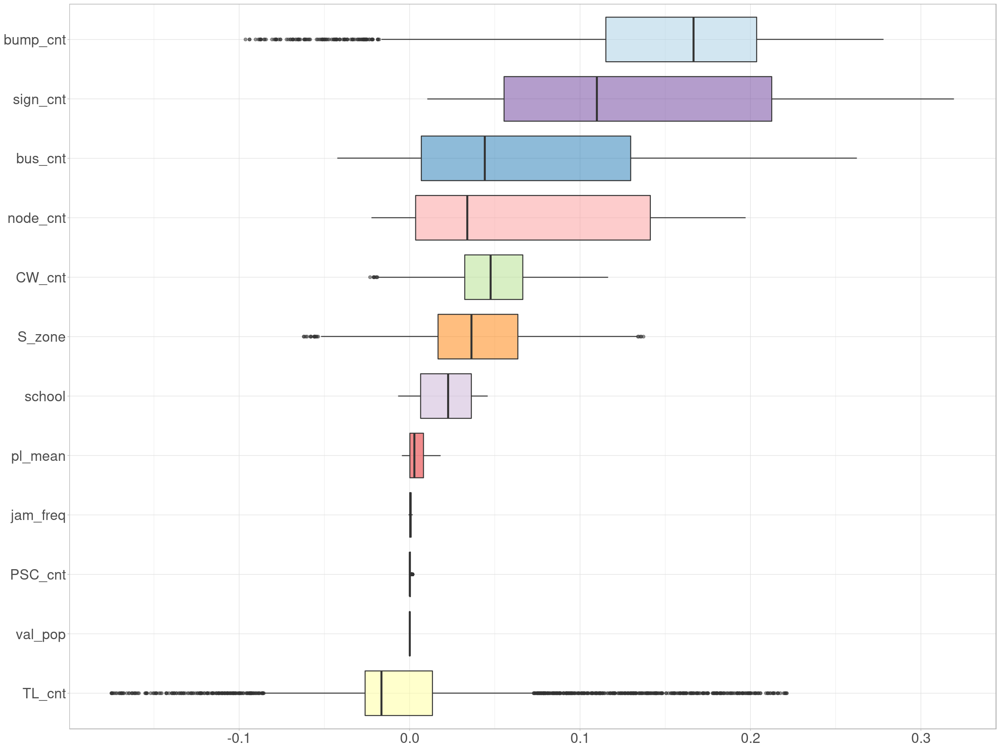

In [75]:
options(repr.plot.width = 20, repr.plot.height = 15)

resultsLong %>% ggplot() + geom_boxplot(aes(x=reorder(key, value, fun=sd), y=value, fill=key), alpha=.5) +
guides(fill=FALSE)+ theme_light() + coord_flip() +
theme(axis.text= element_text(size=20), axis.title=element_blank())  + scale_fill_manual(values = brewer.pal(12, "Paired"))

변수의 계수 별 분포를 시각화한 것입니다. 

In [76]:
final_data2 <- final_data %>% dplyr::select(PSC_cnt, val_pop, pl_mean, S_zone, sign_cnt, CW_cnt,
                            bump_cnt, TL_cnt, bus_cnt, bus_cnt, jam_freq, node_cnt, school)
sp_data2  <- as(final_data2, 'Spatial')
sp_data2

class       : SpatialPolygonsDataFrame 
features    : 2887 
extent      : 126.9953, 127.098, 37.1249, 37.2005  (xmin, xmax, ymin, ymax)
crs         : +proj=longlat +datum=WGS84 +no_defs 
variables   : 12
names       : PSC_cnt, val_pop,          pl_mean, S_zone, sign_cnt, CW_cnt, bump_cnt, TL_cnt, bus_cnt, jam_freq, node_cnt, school 
min values  :       0,       0,                0,      0,        0,      0,        0,      0,       0,        0,        0,      0 
max values  :    4286,    2069, 40.0307378472222,      1,        5,     10,       12,     15,       4,      100,        5,     70 

In [77]:
final_data2$coef.PSC_cnt <- results$PSC_cnt
final_data2$coef.val_pop <- results$val_pop
final_data2$coef.pl_mean <- results$pl_mean
final_data2$coef.S_zone <- results$S_zone
final_data2$coef.sign_cnt <- results$sign_cnt
final_data2$coef.CW_cnt <- results$CW_cnt
final_data2$coef.bump_cnt <- results$bump_cnt
final_data2$coef.TL_cnt <- results$TL_cnt
final_data2$coef.bus_cnt <- results$bus_cnt
final_data2$coef.jam_freq <- results$jam_freq
final_data2$coef.node_cnt <- results$node_cnt
final_data2$coef.school <- results$school

In [78]:
xy <- coordinates(sp_data2)
final_data2 <- cbind(final_data2, xy)

In [79]:
final_data2 <- final_data2 %>% rename('long'='X1', 'lat'='X2') 

In [80]:
osan <- geojson_read('32.오산시_행정경계(읍면동).geojson', what='sp')
osan_fortified <- tidy(osan)
osa_xy <- coordinates(osan)

osan
osan_fortified %>% head()

Regions defined for each Polygons



class       : SpatialPolygonsDataFrame 
features    : 6 
extent      : 126.9949, 127.1031, 37.12532, 37.20087  (xmin, xmax, ymin, ymax)
crs         : +proj=longlat +datum=WGS84 +no_defs 
variables   : 3
names       : BASE_DATE, ADM_DR_CD, ADM_DR_NM 
min values  :  20190630,   3114051,    남촌동 
max values  :  20190630,   3114056,    초평동 

long,lat,order,hole,piece,group,id
<dbl>,<dbl>,<int>,<lgl>,<fct>,<fct>,<chr>
127.0794,37.16193,1,FALSE,1,1.1,1
127.0797,37.16169,2,FALSE,1,1.1,1
127.0798,37.16144,3,FALSE,1,1.1,1
127.0799,37.16138,4,FALSE,1,1.1,1
127.0800,37.16149,5,FALSE,1,1.1,1
127.0800,37.16148,6,FALSE,1,1.1,1


In [81]:
p1 <- ggplot() + geom_polygon(data=osan_fortified, aes(x=long, y =lat, group=group), fill='white', color='grey', size=1.5) +
    coord_map() + theme_void() +
    geom_point(aes(x=final_data2$long, y=final_data2$lat, color=final_data2$coef.PSC_cnt), size=.3) + 
    scale_color_gradient2(high='#008299', mid='white', low='#F2CB61',midpoint=0, guide_legend(title="Coefs for PSC_cnt")) +
    theme(legend.title = element_text(size = 12))

In [82]:
p2 <- ggplot() + geom_polygon(data=osan_fortified, aes(x=long, y =lat, group=group), fill='white', color='grey', size=1.5) +
    coord_map() +theme_void() +
    geom_point(aes(x=final_data2$long, y=final_data2$lat, color=final_data2$coef.pl_mean), size=.5) + 
    scale_color_gradient2(high='#008299', mid='white', low='#F2CB61',midpoint=0, guide_legend(title="Coefs for pl_mean")) +
    theme(legend.title = element_text(size = 12))

In [83]:
p3 <- ggplot() + geom_polygon(data=osan_fortified, aes(x=long, y =lat, group=group), fill='white', color='grey', size=1.5) +
    coord_map() +theme_void() +
    geom_point(aes(x=final_data2$long, y=final_data2$lat, color=final_data2$coef.sign_cnt), size=.5) + 
    scale_color_gradient2(high='#008299', mid='white', low='#F2CB61',midpoint=0, guide_legend(title="Coefs for sign_cnt")) +
    theme(legend.title = element_text(size = 12))

In [84]:
p4 <- ggplot() + geom_polygon(data=osan_fortified, aes(x=long, y =lat, group=group), fill='white', color='grey',size=1.5) +
    coord_map() +theme_void() +
    geom_point(aes(x=final_data2$long, y=final_data2$lat, color=final_data2$coef.CW_cnt),size=.5) + 
    scale_color_gradient2(high='#008299', mid='white', low='#F2CB61',midpoint=0, guide_legend(title="Coefs for CW_cnt")) +
    theme(legend.title = element_text(size = 12))

In [85]:
p5 <- ggplot() + geom_polygon(data=osan_fortified, aes(x=long, y =lat, group=group), fill='white', color='grey',size=1.5) +
    coord_map() +theme_void() +
    geom_point(aes(x=final_data2$long, y=final_data2$lat, color=final_data2$coef.bump_cnt),size=.5) + 
    scale_color_gradient2(high='#008299', mid='white', low='#F2CB61',midpoint=0, guide_legend(title="Coefs for bump_cnt")) +
    theme(legend.title = element_text(size = 12))

In [86]:
p6 <- ggplot() + geom_polygon(data=osan_fortified, aes(x=long, y =lat, group=group), fill='white', color='grey',size=1.5) +
    coord_map() +theme_void() +
    geom_point(aes(x=final_data2$long, y=final_data2$lat, color=final_data2$coef.TL_cnt),size=.5) + 
    scale_color_gradient2(high='#008299', mid='white', low='#F2CB61',midpoint=0, guide_legend(title="Coefs for TL_cnt")) +
    theme(legend.title = element_text(size = 12))

In [87]:
p7 <- ggplot() + geom_polygon(data=osan_fortified, aes(x=long, y =lat, group=group), fill='white', color='grey',size=1.5) +
    coord_map() +theme_void() +
    geom_point(aes(x=final_data2$long, y=final_data2$lat, color=final_data2$coef.bus_cnt),size=.5) + 
    scale_color_gradient2(high='#008299', mid='white', low='#F2CB61',midpoint=0, guide_legend(title="Coefs for bus_cnt")) +
    theme(legend.title = element_text(size = 12))

In [88]:
p8 <- ggplot() + geom_polygon(data=osan_fortified, aes(x=long, y =lat, group=group), fill='white', color='grey',size=1.5) +
    coord_map() +theme_void() +
    geom_point(aes(x=final_data2$long, y=final_data2$lat, color=final_data2$coef.node_cnt),size=.5) + 
    scale_color_gradient2(high='#008299', mid='white', low='#F2CB61',midpoint=0, guide_legend(title="Coefs for node_cnt")) +
    theme(legend.title = element_text(size = 12))

In [89]:
p9 <- ggplot() + geom_polygon(data=osan_fortified, aes(x=long, y =lat, group=group), fill='white', color='grey',size=1.5) +
    coord_map() +theme_void() +
    geom_point(aes(x=final_data2$long, y=final_data2$lat, color=final_data2$coef.school),size=.5) + 
    scale_color_gradient2(high='#008299', mid='white', low='#F2CB61',midpoint=0, guide_legend(title="Coefs for school")) +
    theme(legend.title = element_text(size = 12))

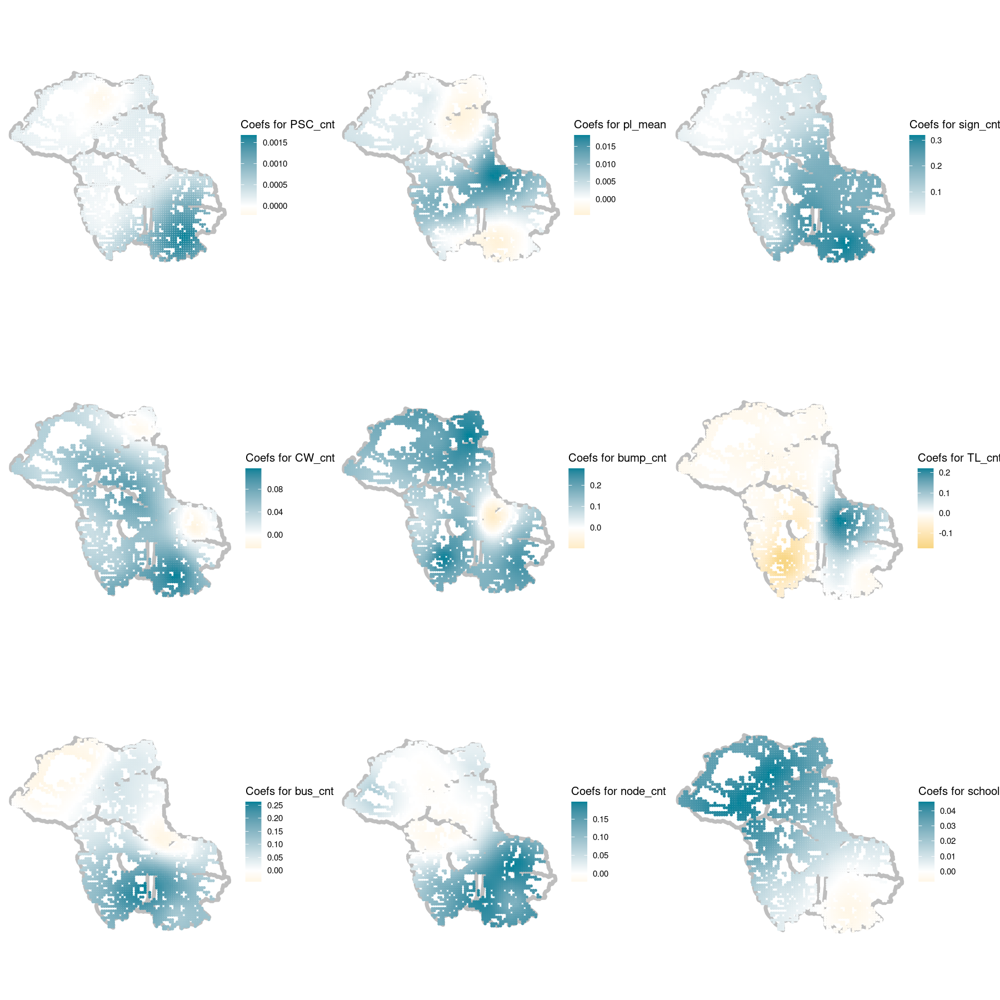

In [90]:
options(repr.plot.width = 15, repr.plot.height = 15)

# 공간적 이질성이 높은 변수들 지도 시각화 

grid.arrange(p1,p2, p3, p4, p5, p6, p7, p8, p9, nrow=3)

공간적 이질성이 통계적으로 유의했던 변수들을 지도에 시각화한 것입니다. 
주정차 단속 수, 평균 유동인구, 표지판 개수, 과속방지턱 개수, 신호등 개수, 버스정류장 개수, 교차로 개수, 어린이 이용 시설 개수 변수들이 어린이 교통사고 수에 미치는 영향의 크기를 색으로 구분했습니다. 푸른색에 가까울수록 어린이 교통사고에 큰 영향을 주는 것으로 파악할 수 있습니다. 

In [91]:
final_data2$localR2 <- results$localR2

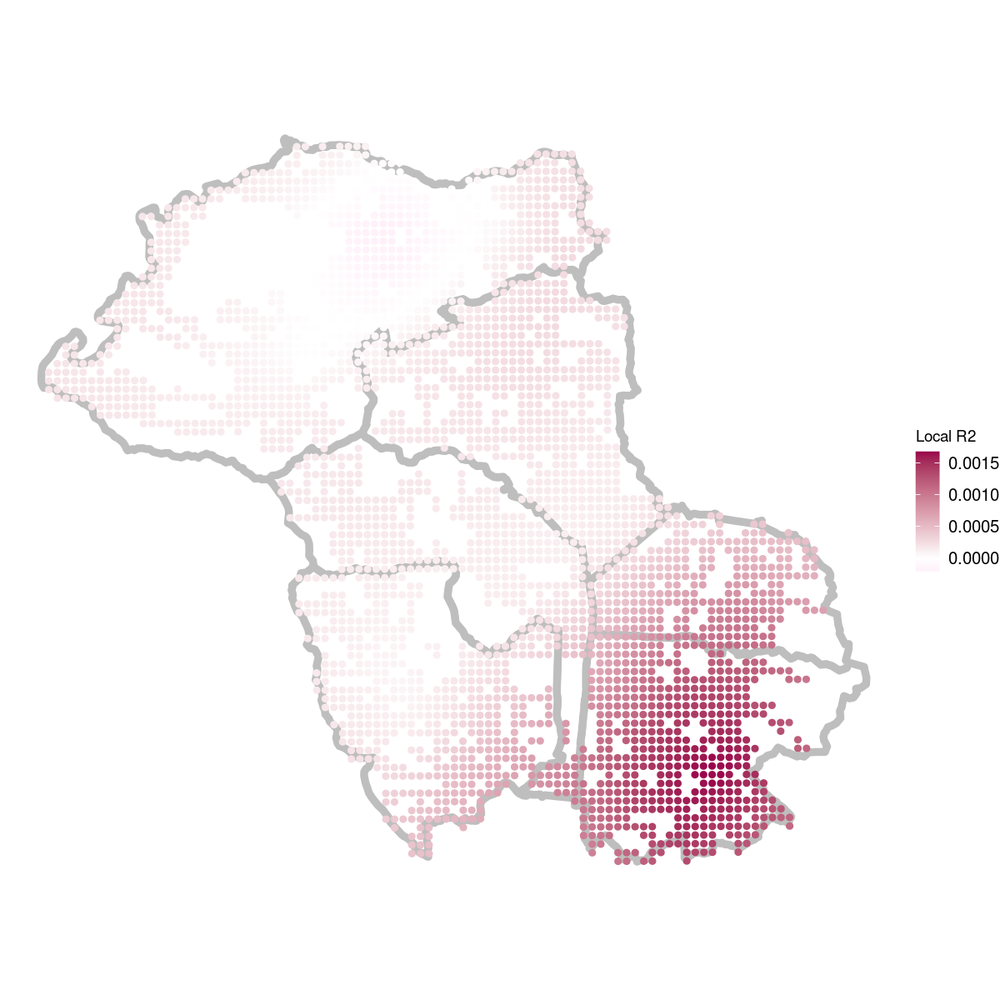

In [92]:
options(repr.plot.width = 10, repr.plot.height = 10)
ggplot() + geom_polygon(data=osan_fortified, aes(x=long, y =lat, group=group), fill='white', color='grey', size=2) +
    coord_map() + theme_void() +
    geom_point(aes(x=final_data2$long, y=final_data2$lat, color=final_data2$coef.PSC_cnt), size=1.5) + 
    scale_color_gradient2(high='#99004C', low='#FF7ECA', guide_legend(title="Local R2")) +
    theme(legend.text = element_text(size = 12))

격자별 회귀식의 local R2, 즉 모형의 설명력을 시각화한 것입니다. 

## 모형별 비교 및 평가

### 1)  모형의 적합성 비교 : AIC, 결정계수(R-squared)

In [93]:
# 다른 모형과 비교
result_df<- t(AIC(lm_ols1, lm_lag, lm_err))
gwr <- c(16,gwr.model$results$AICh)
result_df <- cbind(result_df, gwr)
R.squared <-c(glance(lm_ols1)$r.squared,glance(lm_lag)$r.squared,glance(lm_err)$r.squared,(1 - (gwr.model$results$rss/gwr.model$gTSS)))
result_df <- rbind(result_df, R.squared)
result_df[2:3,]

,lm_ols1,lm_lag,lm_err,gwr
AIC,4490.1542811,4445.8193503,4442.1809754,3987.1644532
R.squared,0.3055534,0.3207302,0.3232458,0.4258055


AIC는 GWR이 가장 작으며, 또한 결정계수 또한 GWR이 가장 크므로, 모델 적합성과 설명력이 가장 높습니다. 

### 2)  잔차의 공간적 자기상관성 변화진단

In [94]:
## OLS모델의 잔차의 공간자기상관성 확인
lm.morantest(lm_ols1, rwm)


	Global Moran I for regression residuals

data:  
model: lm(formula = accident_cnt ~ PSC_cnt + val_pop + pl_mean + S_zone
+ sign_cnt + CW_cnt + bump_cnt + TL_cnt + bus_cnt + jam_freq + node_cnt
+ school, data = dat)
weights: rwm

Moran I statistic standard deviate = 7.283, p-value = 1.632e-13
alternative hypothesis: greater
sample estimates:
Observed Moran I      Expectation         Variance 
    0.0781994373    -0.0011641354     0.0001187461 


In [95]:
## 지리가중회귀모델의 잔차의 공간자기상관성 확인
gwr.morantest(gwr.model, rwm)


	Leung et al. 2000 three moment approximation for Moran's I

data:  GWR residuals
statistic = 17484, df = 16580, p-value = 5.343e-07
sample estimates:
         I 
0.04441173 


공간회귀모형의 잔차에서 자기상관성이 줄어든 것을 볼 수 있습니다.  

##### 모델 적합성과 공간 자기상관성을 종합해서 보았을 때 지리가중회귀모델이 가장 적합하다고 할 수 있습니다.

## 9. 어린이 보호구역 선정   

### 1) 위험도 점수 산정   
PSI(Potential for Safety Improvement, 잠재적 교통안전개선지수) 개념을 활용하여 격자별 위험도 점수를 산정하였습니다.  PSI는 분석 단위 내 발생한 실제 사고건수와 예측된 사고건수의 차이를 말하는데, 즉 회귀식의 종속변수에 대한 잔차와 같습니다.  PSI가 0보다 크면 예측치보다 실제 사고건수가 더 많으므로 동일한 조건에서 잠재적 안전개선 효과가 더 높은 지역으로 해석할 수 있으므로, 저희 팀은 PSI, 즉 잠재적 개선효과가 높은 격자들을 어린이보호구역 선정 후보로 삼고자 했습니다.한편 PSI 값이 동일한 격자들 중에서는 실제로 사고건수가 더 높은 지역에 가중치를 주어서 위험도 점수를 산정했습니다. 

저희가 정한 위험도 점수는 다음과 같습니다. 

#### 어린이 교통사고 위험지역 우선순위 지수

####  = ((잠재적 개선도: PSI)  ×(실제 사고 발생횟수)) / (어린이 교통사고 최대 발생 횟수)  
 
#### =  ((Y-Y ̂ )  ×Y)/(max⁡(Y))

In [96]:
final_df <- final_data %>% mutate(pred=gwr.model$SDF$pred, PSI=accident_cnt-pred, 
                             danger_score = PSI * accident_cnt/max(accident_cnt))  %>% 
    dplyr::select(gid, accident_cnt, S_zone, pred, PSI,danger_score, school)

In [97]:
final_df %>% head(10)

,gid,accident_cnt,S_zone,pred,PSI,danger_score,school,geometry
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<MULTIPOLYGON [°]>
1,다사552085,0,0,-0.0015766028,0.0015766028,0,0,MULTIPOLYGON (((126.9953 37...
2,다사552086,0,0,-0.0005535377,0.0005535377,0,0,MULTIPOLYGON (((126.9953 37...
3,다사552087,0,0,-0.0001618605,0.0001618605,0,0,MULTIPOLYGON (((126.9953 37...
4,다사553084,0,0,-0.0018299183,0.0018299183,0,0,MULTIPOLYGON (((126.9965 37...
5,다사553085,0,0,-0.0009638604,0.0009638604,0,0,MULTIPOLYGON (((126.9965 37...
6,다사553086,0,0,0.0327722267,-0.0327722267,0,0,MULTIPOLYGON (((126.9965 37...
7,다사553087,0,0,0.0003605622,-0.0003605622,0,0,MULTIPOLYGON (((126.9965 37...
8,다사553088,0,0,0.0039352286,-0.0039352286,0,0,MULTIPOLYGON (((126.9965 37...
9,다사554084,0,0,-0.0010278356,0.0010278356,0,0,MULTIPOLYGON (((126.9976 37...


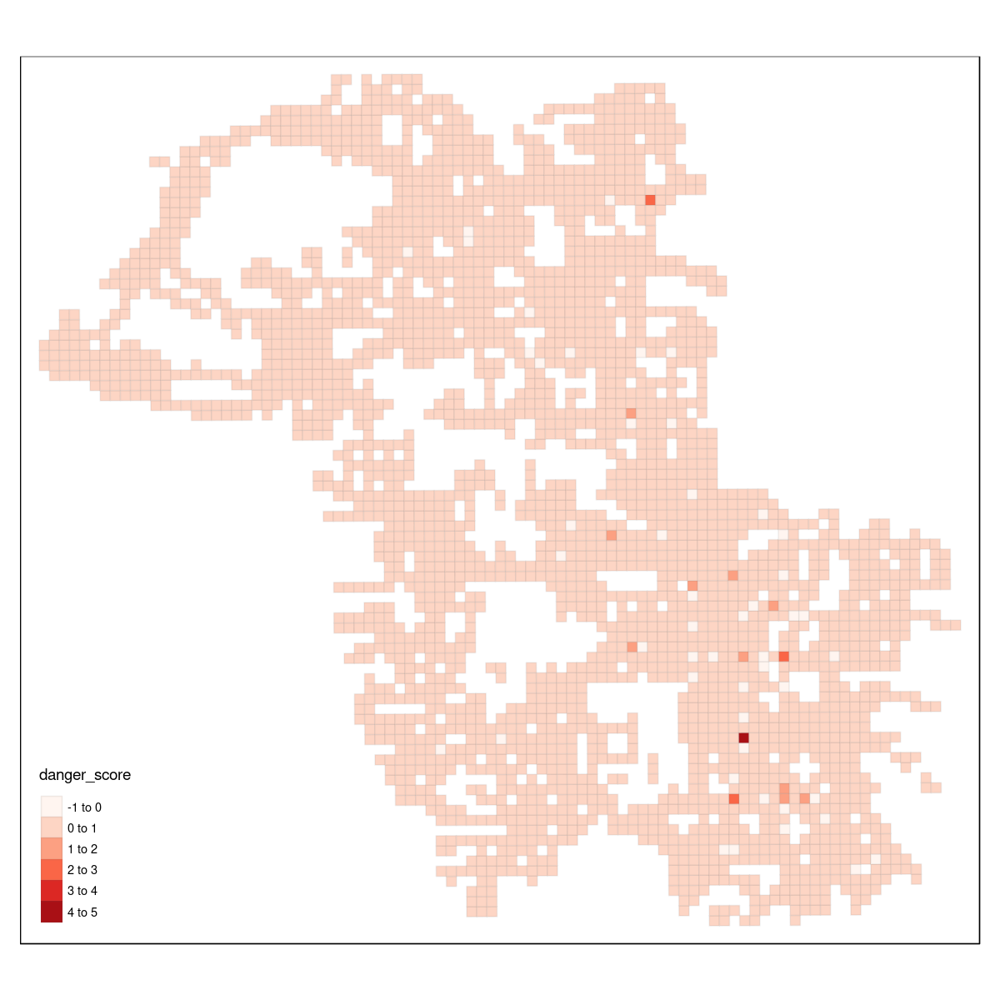

In [98]:
## 어린이 교통사고 위험지수 시각화
tm_shape(final_df) +
 tm_fill('danger_score',palette='Reds') +
 tm_borders(alpha=.1)

어린이 보호구역 외 어린이교통사고 위험지역을 정해야 하므로 어린이 보호구역이 지정된 격자는 제외하고, 위험지수가 높은 곳 20개소를 뽑을 것입니다.

In [99]:
result1 <- final_df %>% arrange(-danger_score)

In [100]:
result1 %>% str()

Classes ‘sf’ and 'data.frame':	2887 obs. of  8 variables:
 $ gid         : Factor w/ 2888 levels "다사552085","다사552086",..: 2358 2313 1926 2507 2473 2126 2493 1795 1778 2494 ...
 $ accident_cnt: num  10 7 6 6 6 5 5 5 5 5 ...
 $ S_zone      : num  0 0 0 0 1 0 0 0 0 0 ...
 $ pred        : num  5.51 3.17 1.97 2.01 2.73 ...
 $ PSI         : num  4.49 3.83 4.03 3.99 3.27 ...
 $ danger_score: num  4.49 2.68 2.42 2.4 1.96 ...
 $ school      : num  1 0 0 0 1 0 0 0 0 0 ...
 $ geometry    :sfc_MULTIPOLYGON of length 2887; first list element: List of 1
  ..$ :List of 1
  .. ..$ : num [1:5, 1:2] 127 127 127 127 127 ...
  ..- attr(*, "class")= chr  "XY" "MULTIPOLYGON" "sfg"
 - attr(*, "sf_column")= chr "geometry"
 - attr(*, "agr")= Factor w/ 3 levels "constant","aggregate",..: NA NA NA NA NA NA NA
  ..- attr(*, "names")= chr  "gid" "accident_cnt" "S_zone" "pred" ...


In [101]:
st_write(result1, "result1_data.geojson") ##geojson으로 결과파일 저장하기

Writing layer `result1_data' to data source `result1_data.geojson' using driver `GeoJSON'
Writing 2887 features with 7 fields and geometry type Multi Polygon.


### 2) 근접 시설 찾기 
어린이교통사고 위험지역은 초등학교, 유치원이나 어린이짐 혹은 학원이나 체육시설을 중심으로 반경을 지정하려 합니다. 따라서 어린이 교통사고 위험지수가 높은 격자들과 가까운 근접 시설을 찾아 그 시설을 어린이교통사고 위험지역으로 선정할 계획입니다. 또한 이때 근접시설은 어린이보호구역으로 지정되있지 않아야 하기에, 어린이 보호구역 리스트와 비교하여 아직 어린이보호구역으로 지정되지 않은 시설만을 분석할 것입니다.

In [102]:
final_df <- st_read("result1_data.geojson")

Reading layer `result1_data' from data source `/opt/app-root/src/result1_data.geojson' using driver `GeoJSON'
Simple feature collection with 2887 features and 7 fields
geometry type:  MULTIPOLYGON
dimension:      XY
bbox:           xmin: 126.9953 ymin: 37.1249 xmax: 127.098 ymax: 37.2005
geographic CRS: WGS 84


In [103]:
data9 = read.csv("9.오산시_어린이보호구역.csv")
data10 = read.csv("10.오산시_학교위치정보.csv")
data13 = read.csv("13.오산시_어린이집_유치원현황.csv")
data29 = read.csv('29.오산시_체육시설현황.csv')
data30 = read.csv("30.오산시_학원_및_교습소_현황.csv")

S_zone_diff1 <- setdiff(data10$학교명,data9$시설명)#어린이보호구역으로 지정이 되지 않은 학교
S_zone_diff2 <- setdiff(data13$시설명,data9$시설명 )#어린이보호구역으로 지정이 되지 않은 유치원

school <- data10  %>% filter(학교구분 == "초등학교") %>% dplyr::select(학교명, 학교위치_경도, 학교위치_위도) %>% filter(학교명 %in% S_zone_diff1)
KDG <- data13 %>% dplyr::select(시설명, 시설위치_경도, 시설위치_위도) %>% filter(시설명 %in% S_zone_diff2)
academy <- data30 %>% dplyr::select(업종구분명, 시설위치_경도, 시설위치_위도)
sport <- data29
colnames(school) <- c("시설명", "lon", 'lat')
colnames(KDG) <- c("시설명", "lon", 'lat')
colnames(sport) <- c("시설명", "lon", 'lat')
colnames(academy) <- c("시설명", "lon", 'lat')
school_notS <- rbind(school, KDG, academy, sport)
ind <- duplicated(school_notS[,2:3]) ##중복 행 제거

In [104]:
school_notS <- school_notS[ind,] ##어린이 보호구역이 아닌 시설들  
rownames(school_notS) <- 1:nrow(school_notS);school_notS  %>% head(10)

,시설명,lon,lat
,<fct>,<dbl>,<dbl>
1,피카소어린이집,127.0553,37.17297
2,시립세교호반어린이집,127.0669,37.17511
3,아띠어린이집,127.0635,37.16348
4,아이숲어린이집,127.0713,37.13778
5,세교꿈사랑어린이집,127.0444,37.17209
6,세교삐아제어린이집,127.0470,37.17517
7,예닮어린이집,127.0543,37.16331
8,우남꿈터어린이집,127.0543,37.16331
9,행복나무어린이집,127.0827,37.13017


In [105]:
cs=CRS("+proj=longlat +datum=WGS84") ##좌표계 설정
school_sp <- SpatialPoints(school_notS[,2:3], proj4string=cs)##경도, 위도를 공간데이터로 만들기
school_sp <- st_as_sf(school_sp) 

In [106]:
school_sp$geometry

POINT (127.0553 37.17297)

POINT (127.0669 37.17511)

POINT (127.0635 37.16348)

POINT (127.0713 37.13778)

POINT (127.0444 37.17209)



Geometry set for 1640 features 
geometry type:  POINT
dimension:      XY
bbox:           xmin: 127.0234 ymin: 37.12923 xmax: 127.0908 ymax: 37.19772
CRS:            +proj=longlat +datum=WGS84 +no_defs
First 5 geometries:

In [107]:
n=50 ##확인할 n의 수 지정

In [108]:
centroid <- st_centroid(final_df %>% arrange(desc(danger_score)) %>% head(n)) ##위험점수가 높은 40개 격자의 중심좌표 구하기
centroid <- st_as_sf(centroid) 

Warning message in st_centroid.sf(final_df %>% arrange(desc(danger_score)) %>% head(n)):
“st_centroid assumes attributes are constant over geometries of x”
Warning message in st_centroid.sfc(st_geometry(x), of_largest_polygon = of_largest_polygon):
“st_centroid does not give correct centroids for longitude/latitude data”


In [109]:
gid_dat <- final_df %>% arrange(desc(danger_score)) %>% head(n)
gid_dat<- gid_dat[,c(1,2,6,8)]

In [110]:
gid_dat %>% head(5)

,gid,accident_cnt,danger_score,geometry
,<fct>,<dbl>,<dbl>,<MULTIPOLYGON [°]>
1,다사621048,10,4.494299,MULTIPOLYGON (((127.0733 37...
2,다사620042,7,2.678255,MULTIPOLYGON (((127.0722 37...
3,다사612101,6,2.419147,MULTIPOLYGON (((127.0628 37...
4,다사625056,6,2.396322,MULTIPOLYGON (((127.0777 37...
5,다사624061,6,1.961542,MULTIPOLYGON (((127.0766 37...


In [111]:
resultdat = data.frame()
dis = c()
## 격자의 중심좌표와 가장 가까운 학교또는 유치원, 학원이나 체육시설 구하기
for (i in 1:n){
    a <- c(centroid$geometry[i], school_sp$geometry) ##거리를 구하려는 메트릭스 만들기
    b <- st_distance(a)[,1] ##거리 구하기
    c <- data.frame(row=1:length(b), dist=as.numeric(b)) %>% arrange(dist) ##가까운 순으로 정렬
    ind <- c[2,1] ##가까운 시설의 index번호 구하기
    dis <- c(dis, c[2,2]) ## 가까운 시설의 거리 리스트로 만들기
    resultdat <- rbind(resultdat,data.frame(school_notS[ind-1,]))
}

In [112]:
resultdat$dist <- dis
resultdat$gid <- gid_dat$gid[1:n]
resultdat$danger_score <- gid_dat$danger_score[1:n]
resultdat$geometry <- gid_dat$geometry[1:n]
resultdat$accidnet_cnt <- gid_dat$accident_cnt[1:n]

In [113]:
resultdat %>% head()

,시설명,lon,lat,dist,gid,danger_score,geometry,accidnet_cnt
,<fct>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<MULTIPOLYGON [°]>,<dbl>
1429,학교교과교습학원,127.0730,37.14170,75.06521,다사621048,4.494299,MULTIPOLYGON (((127.0733 37...,10
1034,학교교과교습학원,127.0717,37.13603,87.84989,다사620042,2.678255,MULTIPOLYGON (((127.0722 37...,7
999,학교교과교습학원,127.0649,37.19652,808.64576,다사612101,2.419147,MULTIPOLYGON (((127.0628 37...,6
1604,테니스,127.0774,37.14981,131.98998,다사625056,2.396322,MULTIPOLYGON (((127.0777 37...,6
726,학교교과교습학원,127.0780,37.15614,321.30561,다사624061,1.961542,MULTIPOLYGON (((127.0766 37...,6
770,학교교과교습학원,127.0694,37.15392,175.07332,다사616063,1.830755,MULTIPOLYGON (((127.0675 37...,5


### 3) 최종 보호구역 선정
어린이교통사고 위험지수가 높은 격자의 중심점과 시설의 거리가 150m이상이면은 격자가 100m x 100m 크기를 가지기에 의미가 없다고 판단하였습니다. 따라서 가장 가까운 시설의 거리가 150m 미만을 필터링하여 어린이교통사고 위험지역 20개소로 지정합니다,

In [114]:
analysis1_result <- resultdat %>% filter(dist <150)##가장가까운 시설이 150m 이상이면 우선지역 후보에서 제외하기

In [115]:
analysis1_result <- analysis1_result[!duplicated(analysis1_result[,c("lon", "lat")]),] ##중복되는 시설 제거

In [116]:
analysis1_result <- analysis1_result %>% head(21)

In [117]:
analysis1_result

,시설명,lon,lat,dist,gid,danger_score,geometry,accidnet_cnt
,<fct>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<MULTIPOLYGON [°]>,<dbl>
1429,학교교과교습학원,127.0730,37.14170,75.06521,다사621048,4.4942993,MULTIPOLYGON (((127.0733 37...,10
1034,학교교과교습학원,127.0717,37.13603,87.84989,다사620042,2.6782552,MULTIPOLYGON (((127.0722 37...,7
1604,테니스,127.0774,37.14981,131.98998,다사625056,2.3963222,MULTIPOLYGON (((127.0777 37...,6
183,학교교과교습학원,127.0581,37.15978,93.22706,다사608068,1.1008640,MULTIPOLYGON (((127.0585 37...,4
836,학교교과교습학원,127.0742,37.14950,87.99874,다사621056,1.0890367,MULTIPOLYGON (((127.0732 37...,5
151,학교교과교습학원,127.0820,37.13576,137.02832,다사627042,1.0585274,MULTIPOLYGON (((127.08 37.1...,4
1155,학교교과교습학원,127.0705,37.13417,77.56479,다사618039,0.8318316,MULTIPOLYGON (((127.0699 37...,3
23,학교교과교습학원,127.0688,37.13393,74.11146,다사617039,0.8082667,MULTIPOLYGON (((127.0688 37...,4
587,학교교과교습학원,127.0654,37.17075,70.02376,다사614081,0.8034768,MULTIPOLYGON (((127.0652 37...,4


In [118]:
st_write(analysis1_result, "analysis1_result.geojson") ##최종 어린이보호구역 외 어린이교통사고위험지역 20개소 선정

Writing layer `analysis1_result' to data source `analysis1_result.geojson' using driver `GeoJSON'
Writing 21 features with 7 fields and geometry type Multi Polygon.


In [119]:
#최종결과 시각화
library(leaflet)
data31 <- st_read("31.오산시_법정경계(시군구).geojson")
m <- leaflet() %>% addTiles() %>% 
    setView(lng = 127.048396, lat = 37.165397, zoom = 12) %>% 
    addProviderTiles("CartoDB.Positron") %>% 
    addPolygons(data=data31, color="#FFA7A7") %>% 
    addCircleMarkers(data = analysis1_result, color = "#CC3D3D",radius=4)

m

Reading layer `31' from data source `/opt/app-root/src/31.오산시_법정경계(시군구).geojson' using driver `GeoJSON'
Simple feature collection with 1 feature and 2 fields
geometry type:  MULTIPOLYGON
dimension:      XY
bbox:           xmin: 126.9949 ymin: 37.12532 xmax: 127.1031 ymax: 37.20087
geographic CRS: WGS 84


Assuming "lon" and "lat" are longitude and latitude, respectively



HTML widgets cannot be represented in plain text (need html)